In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import math
import pylab as py
import sys
import numpy.ma as ma
from decimal import Decimal
import sqlite3
import pandas as pd
import os
from importlib import reload
from matplotlib import animation, rc
import matplotlib.animation as animation
from matplotlib.ticker import FormatStrFormatter
import types
from IPython.display import HTML
import contours
import blobs
import warnings

### Preparing the data

In [2]:
arr_all = np.load('C:\\Users\\giannis\\Desktop\\Python_scrpts\\ti262\\ne_mid_CMOD.npy')
arr_tor = arr_all.mean(2)
arr_avg = arr_tor.mean(0)
new_arr = arr_all[800,:,0,:]

### We are working with an array in the [R,Z] form. The correct way to display it is either with pcolor on a mesh or with imshow. In the case of imshow for correct display we need to take a transpose and invert the y-axis.

In [3]:
'''Define the perturbed matrix, use a nine-point smoothing and swap axes to make it in R,Z form.'''
work = (new_arr-arr_avg)/arr_avg
sw = blobs.frame_smooth(work) 
sw = np.swapaxes(sw,0,1)
work = np.swapaxes(work,0,1)

C:\Users\Giannis\Desktop\Python_scrpts\blobs.py:279: RuntimeWarning: invalid value encountered in sign
  return abs(np.sign(x))


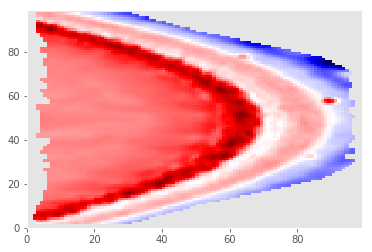

In [4]:
'''Plotting with pcolor.'''
x =  np.arange(0,sw.shape[0],1)
y = np.arange(0,sw.shape[1],1)
X,Y = np.meshgrid(x,y)
plt.pcolor(X,Y,sw[X,Y],cmap='seismic')
plt.show()

### In order to plot as an image we need to take transpose and invert the y-axis.

In [5]:
fsw = np.flipud(sw.T)

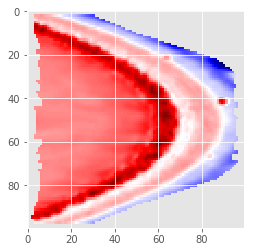

In [6]:
'''Plotting with imshow.'''
plt.imshow(fsw,cmap='seismic')

### However, flipping the matrix displays correctly with imshow But the y-axis is flipped. So, it is preferable to take the transpose, work with this matrix and then use pcolor at the display.

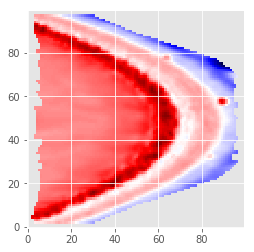

In [7]:
tsw = sw.T
plt.imshow(tsw,cmap='seismic')
plt.gca().invert_yaxis()

### To get the contours you feed the transposed matrix to the measure function. The contours then are in the form (y,x).

In [8]:
from skimage import measure

In [9]:
contours = measure.find_contours(tsw,0.11)

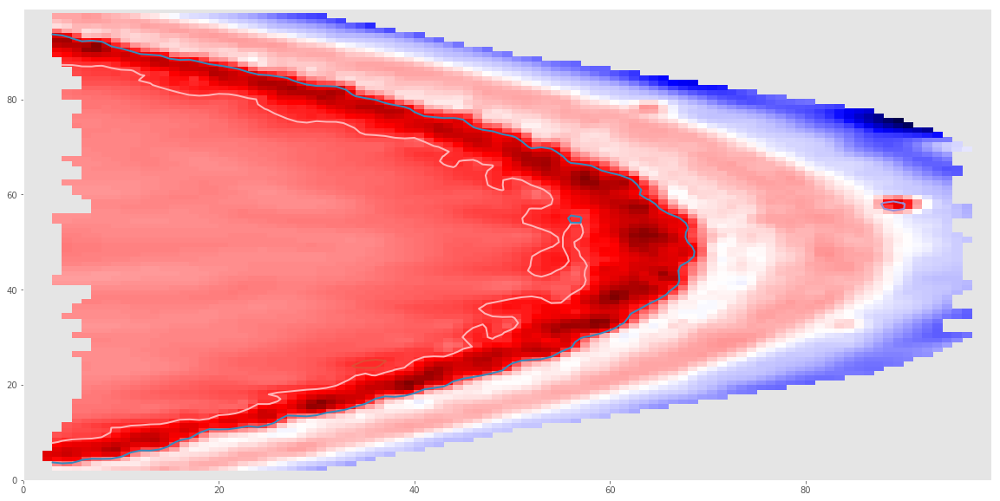

In [10]:
fig, ax = plt.subplots(figsize=(20,10))
#ax.imshow(fsw, interpolation='nearest')
ax.pcolor(X,Y,sw[X,Y],cmap='seismic')
for contour in contours:
    ax.plot(contour[:, 1],contour[:, 0], linewidth=2)

### Pick a very clear contour to check if the peak finding method works.

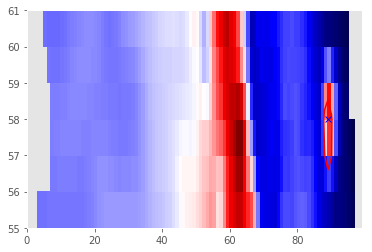

In [11]:
C = contours[9]
_,px,py = blobs.find_peak(sw,C)
plt.pcolor(X[85:92],Y[55:62],sw[X[85:92],Y[55:62]],cmap='seismic')
plt.plot(C[:,1],C[:,0],color = 'r')
plt.plot(px,py,"b",marker='x')

### We draw the conclusion that the find_contour method needs the transposed array but the find_peak method needs the original one!

### Draw all peaks and contours from a particular range.

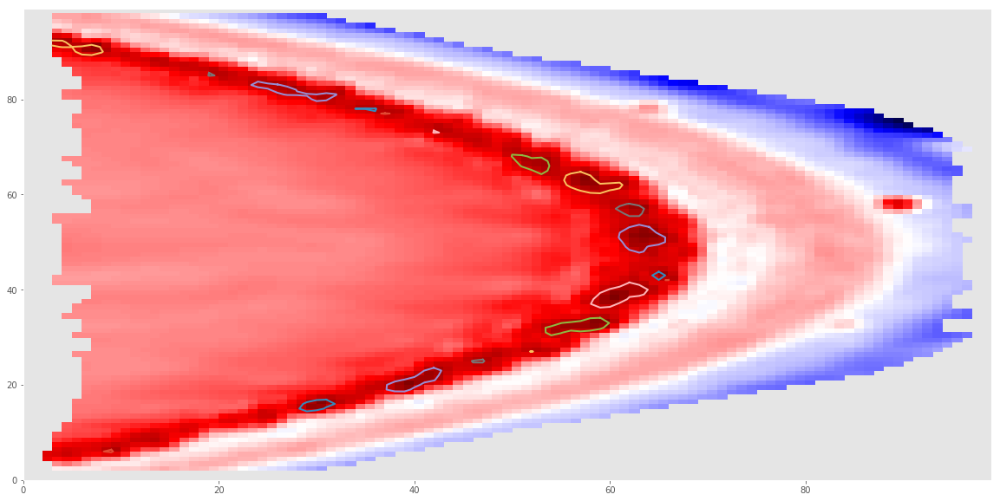

In [12]:
contoursT = measure.find_contours(tsw,0.33)
fig, ax = plt.subplots(figsize=(20,10))
ax.pcolor(X,Y,sw[X,Y],cmap='seismic')
for contour in contoursT:
    ax.plot(contour[:, 1],contour[:, 0], linewidth=2)

In [126]:
reload(blobs)

<module 'blobs' from 'C:\\Users\\Giannis\\Desktop\\Python_scrpts\\blobs.py'>

In [13]:
peak_list, C_list = blobs.peaks(sw,0.28,0.38)

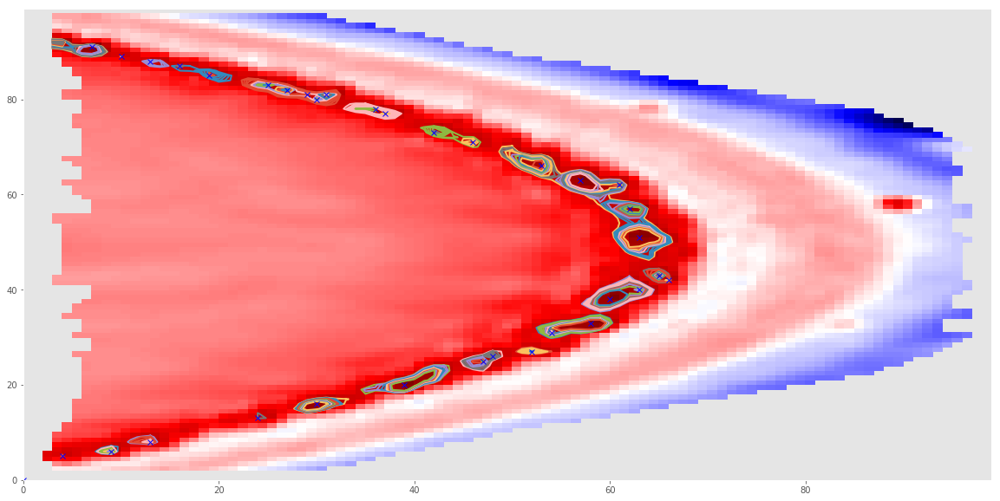

In [14]:
fig, ax = plt.subplots(figsize=(20,10))
ax.pcolor(X,Y,sw[X,Y],cmap='seismic')
for contours in C_list:
    for contour in contours:
        ax.plot(contour[:, 1],contour[:, 0], linewidth=2)
for peak in peak_list:
        ax.plot(peak[1],peak[2],"b", marker='x',markersize = 6)

### Rejecting all contours that encompass more than one peak.

In [24]:
contour_list = blobs.double_peak_rejection(peak_list,C_list)

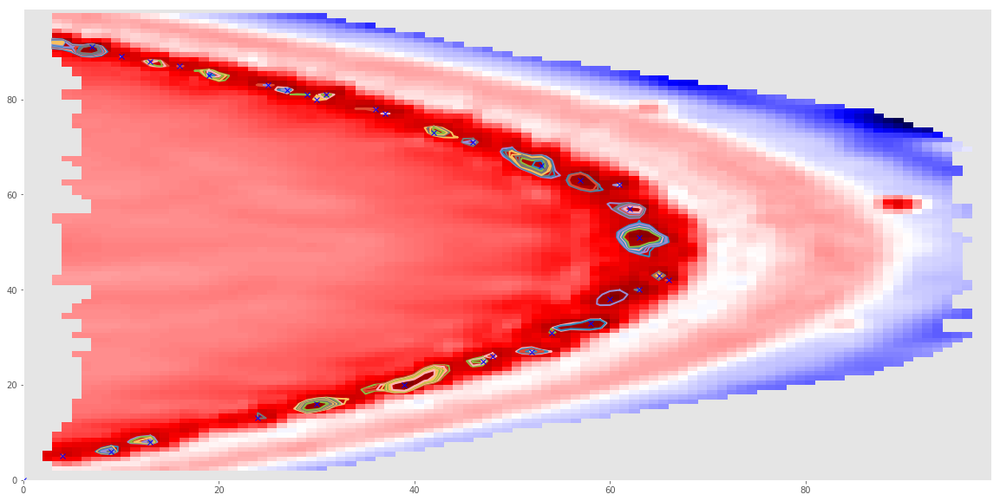

In [25]:
fig, ax = plt.subplots(figsize=(20,10))
ax.pcolor(X,Y,sw[X,Y],cmap='seismic')
for contour in contour_list:
    ax.plot(contour[:, 1],contour[:, 0], linewidth=2)
for peak in peak_list:
    ax.plot(peak[1],peak[2],"b", marker='x',markersize = 6)

### From the contours that share the same peak, keep the one with the largest area.

In [28]:
ncl = blobs.contour_reduction(peak_list,contour_list)

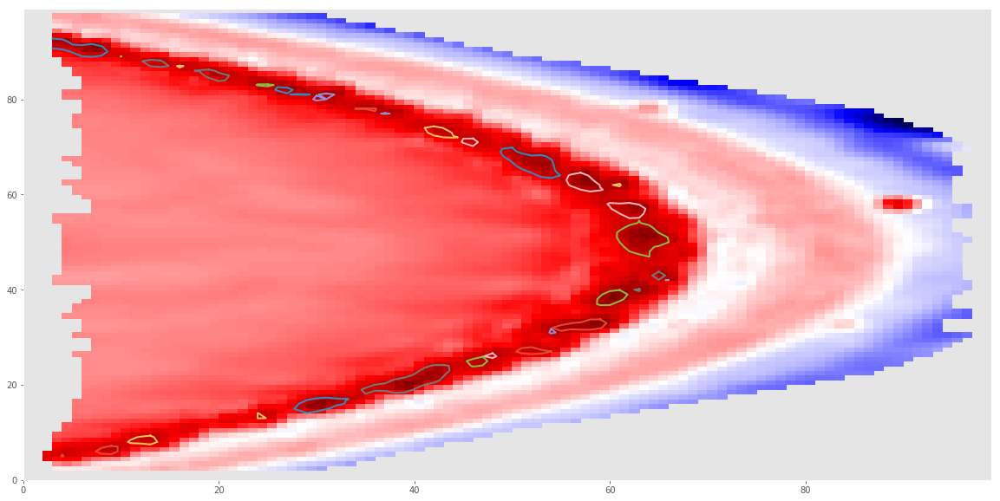

In [30]:
fig, ax = plt.subplots(figsize=(20,10))
ax.pcolor(X,Y,sw[X,Y],cmap='seismic')
for i in range(len(ncl)):
    contour_ind = ncl[i][0]
    contour = contour_list[contour_ind]
    ax.plot(contour[:, 1],contour[:, 0], linewidth=2)

### Check function for polygon area

In [31]:
test_list = [4,13,26,38,53,66,81,94,108,124]
tcl = []
for i in test_list:
    tcl.append(contour_list[i])

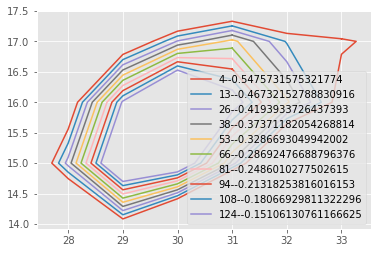

In [32]:
for i in test_list:
    area = blobs.PolyArea(contour_list[i][:,1],contour_list[i][:,0])
    plt.plot(contour_list[i][:,1],contour_list[i][:,0], label = "%s--%s" %(i,area))
plt.legend()

In [33]:
ncl = blobs.contour_reduction(peak_list, contour_list)

In [34]:
reload(blobs)

<module 'blobs' from 'C:\\Users\\Giannis\\Desktop\\Python_scrpts\\blobs.py'>

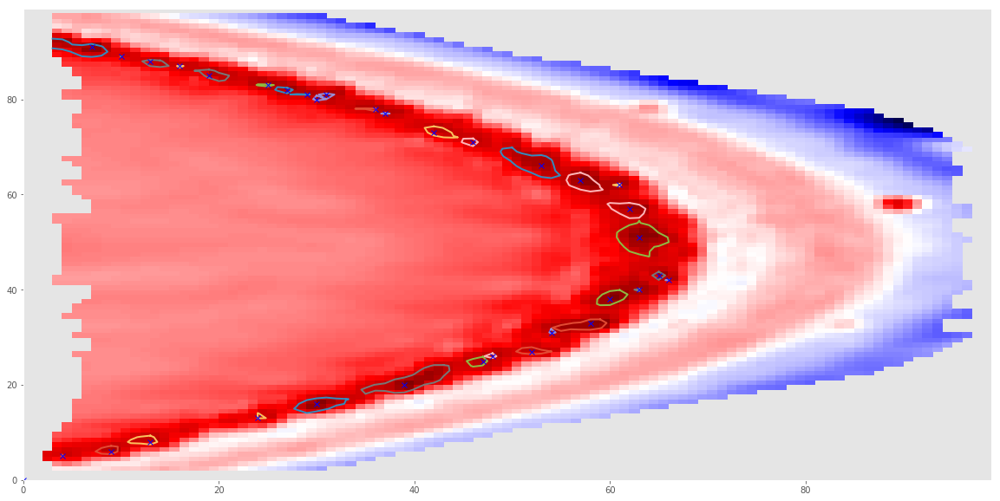

In [35]:
fig, ax = plt.subplots(figsize=(20,10))
ax.pcolor(X,Y,sw[X,Y],cmap='seismic')
for i in range(len(ncl)):
    contour_ind = ncl[i][0]
    contour = contour_list[contour_ind]
    ax.plot(contour[:, 1],contour[:, 0], linewidth=2)
for peak in peak_list:
    ax.plot(peak[1],peak[2],"b", marker='x',markersize = 6)

### Fitting Ellipses on contours.

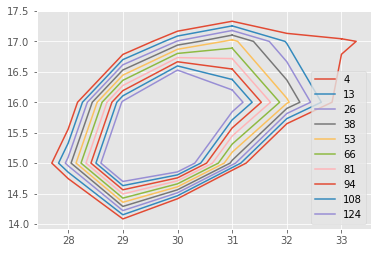

In [36]:
for i in test_list:
    plt.plot(contour_list[i][:,1],contour_list[i][:,0], label = "%s" %(i))
plt.legend()

In [37]:
el_rot1, x1, y1, t1, a1, b1 = blobs.ellipse(contour_list[4][:,1],contour_list[4][:,0])

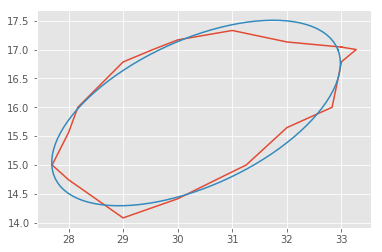

In [38]:
plt.plot(contour_list[4][:,1],contour_list[4][:,0])
plt.plot(x1+el_rot1[0,:], y1+el_rot1[1,:])
plt.show()

In [39]:
blobs.goodness_of_fit(contour_list[4][:,1],contour_list[4][:,0],x1+el_rot1[0,:], y1+el_rot1[1,:])

0.6846667456221002

C:\Users\Giannis\Desktop\Python_scrpts\blobs.py:492: RuntimeWarning: invalid value encountered in sqrt
  res2=np.sqrt(up/down2)
C:\Users\Giannis\Desktop\Python_scrpts\blobs.py:491: RuntimeWarning: invalid value encountered in sqrt
  res1=np.sqrt(up/down1)


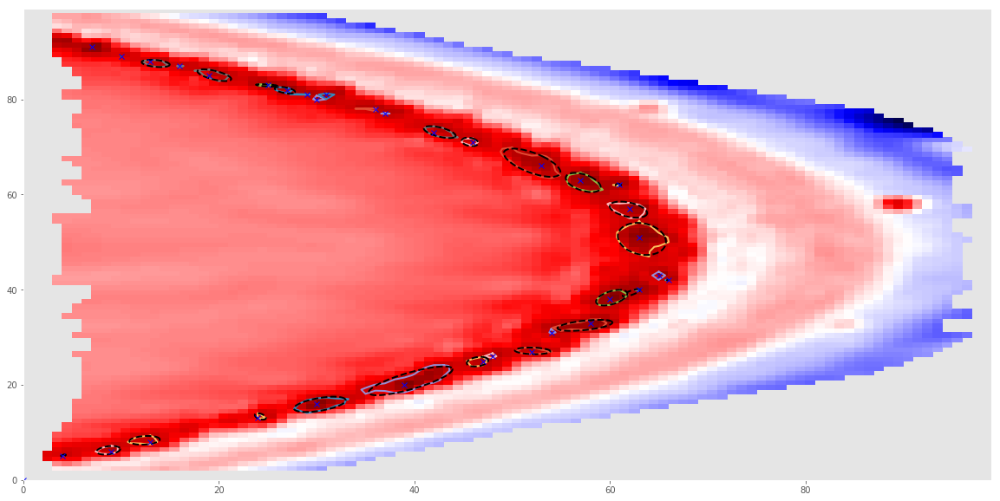

In [40]:
fig, ax = plt.subplots(figsize=(20,10))
ax.pcolor(X,Y,sw[X,Y],cmap='seismic')
for i in range(len(ncl)):
    contour_ind = ncl[i][0]
    contour = contour_list[contour_ind]
    if np.isnan(contour).any() == False:
        el_rot, x, y, t, a, b = blobs.ellipse(contour[:,1],contour[:,0])
        ax.plot(contour[:, 1],contour[:, 0], linewidth=2)
        ax.plot(x+el_rot[0,:],y+el_rot[1,:],linewidth = 2, color = 'k',linestyle = "--")
    else:
        pass
for peak in peak_list:
    ax.plot(peak[1],peak[2],"b", marker='x',markersize = 6)

### Goodness of Fit test.

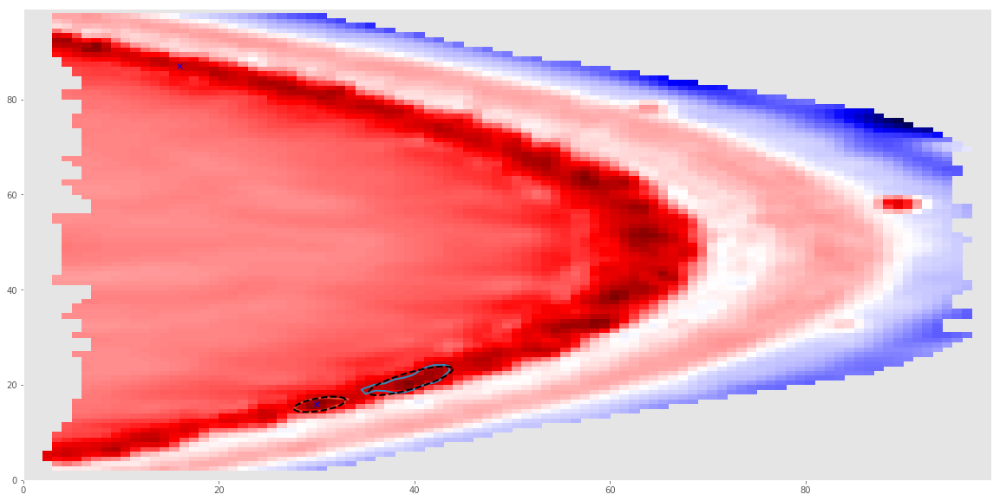

In [42]:
fig, ax = plt.subplots(figsize=(20,10))
ax.pcolor(X,Y,sw[X,Y],cmap='seismic')

peak1 = peak_list[1]
peak2 = peak_list[25]
good_contour_ind = ncl[1][0]
bad_contour_ind = ncl[24][0]
good_contour = contour_list[good_contour_ind]
bad_contour = contour_list[bad_contour_ind]
if np.isnan(contour).any() == False:
    el_rot_g, x_g, y_g, t_g, a_g, b_g = blobs.ellipse(good_contour[:,1],good_contour[:,0])
    el_rot_b, x_b, y_b, t_b, a_b, b_b = blobs.ellipse(bad_contour[:,1],bad_contour[:,0])
    ax.plot(good_contour[:, 1],good_contour[:, 0], linewidth=2)
    ax.plot(bad_contour[:, 1],bad_contour[:, 0], linewidth=2)
    ax.plot(x_g+el_rot_g[0,:],y_g+el_rot_g[1,:],linewidth = 2, color = 'k',linestyle = "--")
    ax.plot(x_b+el_rot_b[0,:],y_b+el_rot_b[1,:],linewidth = 2, color = 'k',linestyle = "--")
    ax.plot(peak1[1],peak1[2],"b", marker='x',markersize = 6)
    ax.plot(peak2[1],peak2[2],"b", marker='x',markersize = 6)
else:
    pass

In [57]:
blobs.cpr(sw,peak_list[1],peak_list[25])

[array([0.4472574]),
 array([0.35589463]),
 array([0.29254005]),
 array([0.26394509]),
 array([0.27176893]),
 array([0.28221133]),
 array([0.27221123]),
 array([0.31907353]),
 array([0.39526447]),
 array([0.46334621])]

In [30]:
print("Goodness of fit for good contour:",blobs.goodness_of_fit(good_contour[:,1],good_contour[:,0],x_g+el_rot_g[0,:], y_g+el_rot_g[1,:]))
print("Goodness of fit for bad contour:",blobs.goodness_of_fit(bad_contour[:,1],bad_contour[:,0],x_b+el_rot_b[0,:], y_b+el_rot_b[1,:]))

Goodness of fit for good contour: 0.6846667456221002
Goodness of fit for bad contour: 2.1773409631997804


### Full analysis of single frame.

In [7]:
reload(blobs)

<module 'blobs' from 'C:\\Users\\Giannis\\Desktop\\Python_scrpts\\blobs.py'>

In [8]:
C_l, P_l, L_l, E_l, A_l = blobs.analyze_frame(arr_all,800,0.28,0.38)

C:\Users\Giannis\Desktop\Python_scrpts\blobs.py:233: RuntimeWarning: invalid value encountered in sqrt
  res2=np.sqrt(up/down2)
C:\Users\Giannis\Desktop\Python_scrpts\blobs.py:232: RuntimeWarning: invalid value encountered in sqrt
  res1=np.sqrt(up/down1)


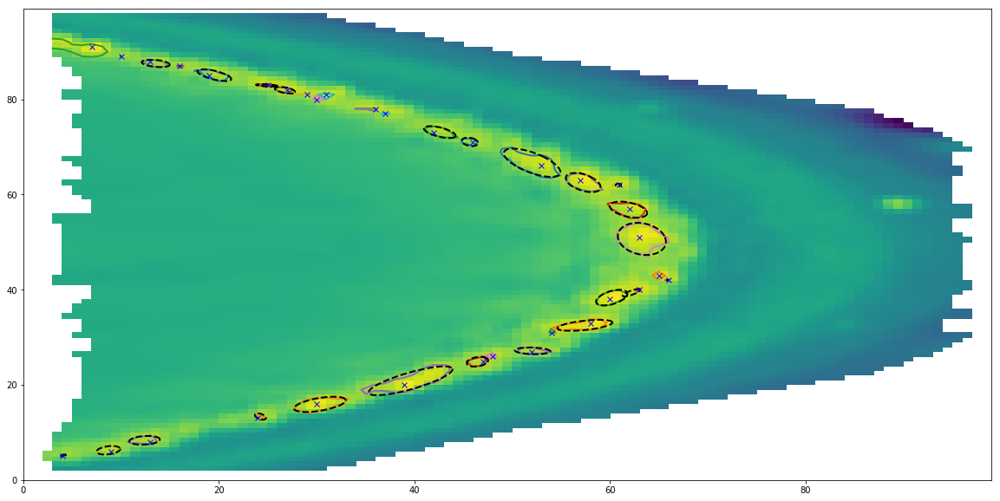

In [9]:
fig, ax = plt.subplots(figsize=(20,10))
ax.pcolor(X,Y,sw[X,Y])
for contour in C_l:
    ax.plot(contour[:, 1],contour[:, 0], linewidth=2)
for j in range(len(E_l)):
    if ~np.isnan(E_l[j][0]).any():
        ax.plot(E_l[j][1]+E_l[j][0][0], E_l[j][2]+E_l[j][0][1],linewidth = 2, color = 'k',linestyle = "--")
    else:
        pass
for peak in P_l:
    ax.plot(peak[1],peak[2],"b", marker='x',markersize = 6)

In [10]:
sw_new = blobs.prepare_data(arr_all,750)

In [11]:
C_l, P_l, L_l, E_l, A_l = blobs.analyze_frame(arr_all,750,0.28,0.44)

C:\Users\Giannis\Desktop\Python_scrpts\blobs.py:232: RuntimeWarning: invalid value encountered in sqrt
  res1=np.sqrt(up/down1)
C:\Users\Giannis\Desktop\Python_scrpts\blobs.py:233: RuntimeWarning: invalid value encountered in sqrt
  res2=np.sqrt(up/down2)


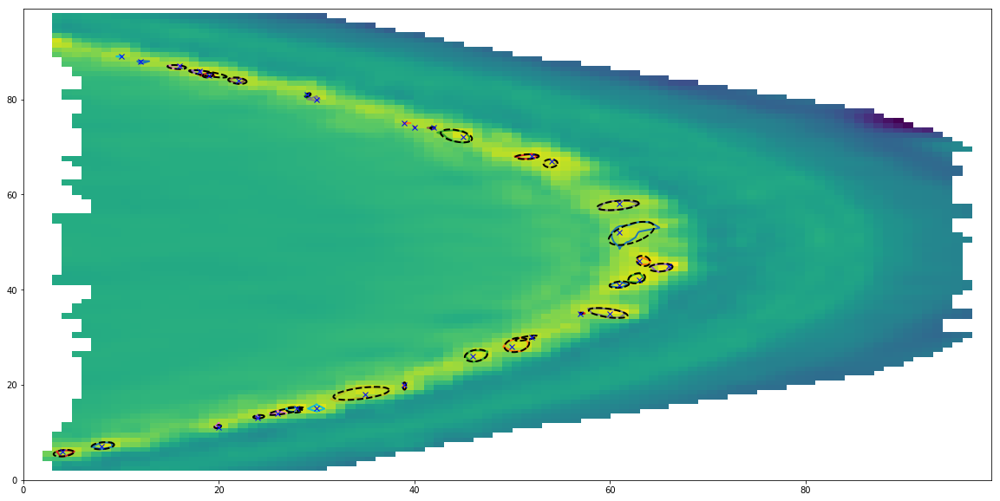

In [12]:
fig, ax = plt.subplots(figsize=(20,10))
ax.pcolor(X,Y,sw_new[X,Y])
for contour in C_l:
    ax.plot(contour[:, 1],contour[:, 0], linewidth=2)
for j in range(len(E_l)):
    if ~np.isnan(E_l[j][0]).any():
        ax.plot(E_l[j][1]+E_l[j][0][0], E_l[j][2]+E_l[j][0][1],linewidth = 2, color = 'k',linestyle = "--")
    else:
        pass
for peak in P_l:
    ax.plot(peak[1],peak[2],"b", marker='x',markersize = 6)

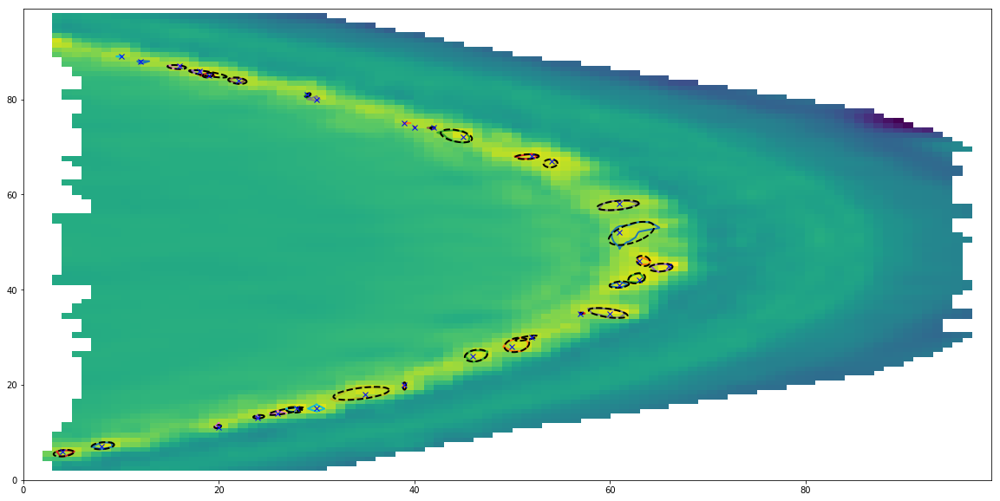

In [37]:
blobs.draw_frame(sw_new, C_l, P_l, E_l)

### Database and table creation

In [18]:
conn = sqlite3.connect("blobs_CMOD")

In [19]:
c = conn.cursor()

In [41]:
#c.execute('''CREATE TABLE IF NOT EXISTS example_key (peak_value float, peak_x float, peak_y float, area float, level float, el_x float, el_y float, tilt float, maj_ax float, min_ax float, goodness float )''')

In [42]:
#for i in range(len(E_l)):
    #c.execute("INSERT INTO example5 VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?)", (P_l[i][0], P_l[i][1], P_l[i][2], A_l[i], L_l[i][0], E_l[i][1], E_l[i][2], E_l[i][3], E_l[i][4], E_l[i][5], E_l[i][6]))
#conn.commit()

In [43]:
#for row in c.execute('''SELECT ROWID,peak_value FROM example5 WHERE ROWID=3'''):
#    print(row)

In [44]:
#for i in range(0,4):
#    for row in c.execute("SELECT ROWID,peak_value FROM example5 WHERE ROWID="+str(i)):
#        print(row)

In [45]:
%%capture
#for row in c.execute('''SELECT ROWID,* FROM example5'''):
#    print(row)

In [46]:
%%capture
#c.execute("SELECT name FROM sqlite_master WHERE type='table';")
#print(c.fetchall())

In [47]:
#c.execute("DROP TABLE example_key")

In [47]:
#rows = []
#for row in c.execute("SELECT ROWID,* FROM t_698"):
#    rows.append(row)

In [15]:
#for row in rows:
#    print(row[2],row[3])

In [51]:
#fig, ax = plt.subplots(figsize=(20,10))
#ax.pcolor(X,Y,sw_new[X,Y])
#for row in rows:
#    if row[4]>=1.0:
#        if ~pd.isnull([row[6],row[7],row[9],row[10],row[8]]).any():
#            Ell_rot = blobs.draw_ellipse(row[6],row[7],row[9],row[10],row[8])
#            ax.plot(row[6]+Ell_rot[0,:],row[7]+Ell_rot[1,:],linewidth = 2, color = 'k',linestyle = "--")
#            ax.plot(row[2],row[3],"b", marker='x',markersize = 6)
#            ax.annotate('blob_'+str(row[0]), xy=(row[6],row[7]),xytext=(-20,20),textcoords='offset points', ha='right', va='bottom',
#        bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
#        arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))


In [26]:
reload(blobs)

<module 'blobs' from 'C:\\Users\\Giannis\\Desktop\\Python_scrpts\\blobs.py'>

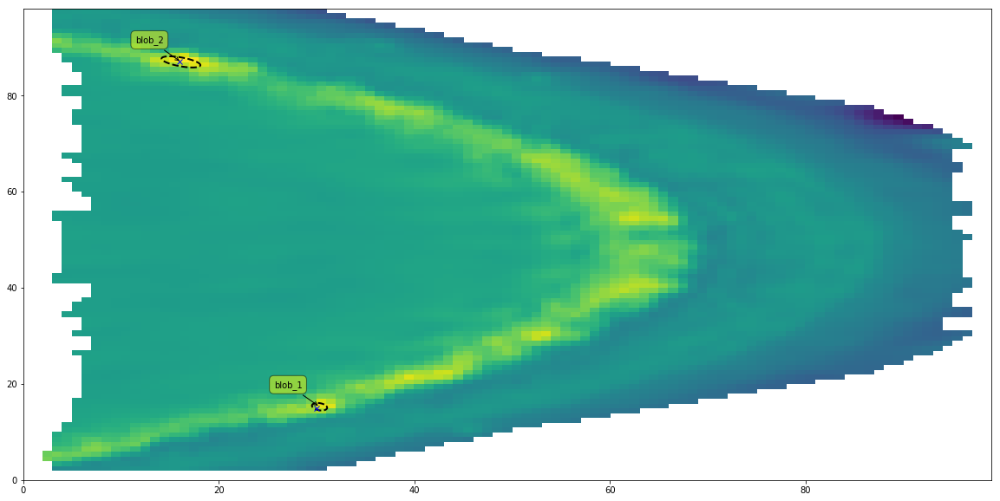

In [53]:
blobs.db_draw_frame(arr_all,698)

In [20]:
#%%capture
c.execute("SELECT name FROM sqlite_master WHERE type='table';")
print(c.fetchall())

[('t_0',), ('t_1',), ('t_2',), ('t_3',), ('t_4',), ('t_5',), ('t_6',), ('t_7',), ('t_8',), ('t_9',), ('t_10',), ('t_11',), ('t_12',), ('t_13',), ('t_14',), ('t_15',), ('t_16',), ('t_17',), ('t_18',), ('t_19',), ('t_20',), ('t_21',), ('t_22',), ('t_23',), ('t_24',), ('t_25',), ('t_26',), ('t_27',), ('t_28',), ('t_29',), ('t_30',), ('t_31',), ('t_32',), ('t_33',), ('t_34',), ('t_35',), ('t_36',), ('t_37',), ('t_38',), ('t_39',), ('t_40',), ('t_41',), ('t_42',), ('t_43',), ('t_44',), ('t_45',), ('t_46',), ('t_47',), ('t_48',), ('t_49',), ('t_50',), ('t_51',), ('t_52',), ('t_53',), ('t_54',), ('t_55',), ('t_56',), ('t_57',), ('t_58',), ('t_59',), ('t_60',), ('t_61',), ('t_62',), ('t_63',), ('t_64',), ('t_65',), ('t_66',), ('t_67',), ('t_68',), ('t_69',), ('t_70',), ('t_71',), ('t_72',), ('t_73',), ('t_74',), ('t_75',), ('t_76',), ('t_77',), ('t_78',), ('t_79',), ('t_80',), ('t_81',), ('t_82',), ('t_83',), ('t_84',), ('t_85',), ('t_86',), ('t_87',), ('t_88',), ('t_89',), ('t_90',), ('t_91',

In [55]:
reload(blobs)

<module 'blobs' from 'C:\\Users\\Giannis\\Desktop\\Python_scrpts\\blobs.py'>

In [56]:
#blobs.table_creation(arr_all, 680, 0.28,0.38)

In [57]:
#blobs.db_creation(arr_all, 0, 890, 0.4, 0.9)

### Data Selection

In [29]:
reload(blobs)

<module 'blobs' from 'C:\\Users\\Giannis\\Desktop\\Python_scrpts\\blobs.py'>

C:\Users\Giannis\Desktop\Python_scrpts\blobs.py:240: RuntimeWarning: invalid value encountered in sqrt
  res1=np.sqrt(up/down1)
C:\Users\Giannis\Desktop\Python_scrpts\blobs.py:241: RuntimeWarning: invalid value encountered in sqrt
  res2=np.sqrt(up/down2)


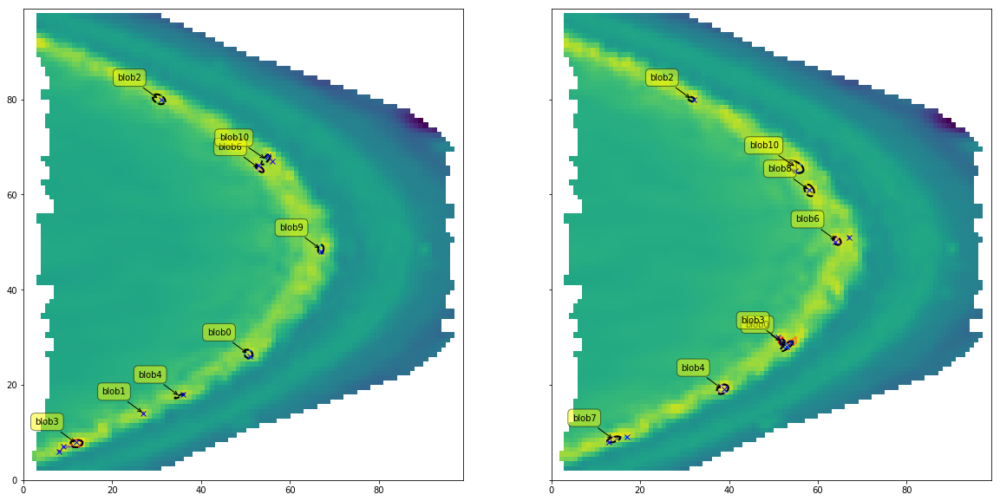

In [5]:
blobs.draw_frames(arr_all,820,821,0.40,0.9)

### Blob Tracking

In [29]:
reload(blobs)

<module 'blobs' from 'C:\\Users\\Giannis\\Desktop\\Python_scrpts\\blobs.py'>

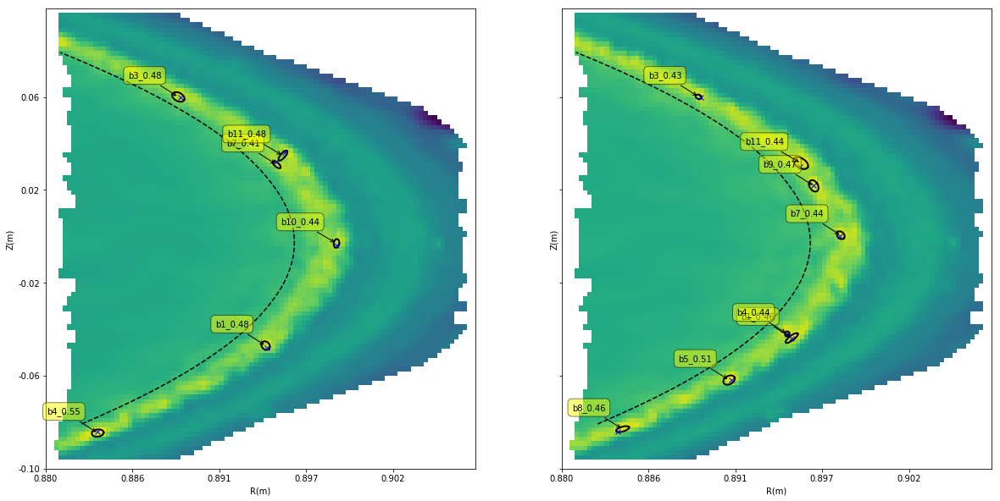

In [9]:
blobs.db_draw_frames(arr_all,820,821)

In [5]:
S,areas = blobs.score_matrix(820,821)

In [6]:
S

array([[ 0.00,  1.00,  3.00,  4.00,  7.00,  10.00,  11.00],
       [ 1.00,  0.21,  0.00,  0.00,  0.00,  0.00,  0.00],
       [ 3.00,  0.00,  0.19,  0.00,  0.00,  0.00,  0.00],
       [ 4.00,  0.33,  0.00,  0.00,  0.00,  0.00,  0.00],
       [ 5.00,  0.00,  0.00,  0.00,  0.00,  0.00,  0.00],
       [ 7.00,  0.00,  0.00,  0.00,  0.00,  0.19,  0.00],
       [ 8.00,  0.00,  0.00,  0.43,  0.00,  0.00,  0.00],
       [ 9.00,  0.00,  0.00,  0.00,  0.00,  0.00,  0.00],
       [ 11.00,  0.00,  0.00,  0.00,  0.13,  0.00,  0.04]])

In [7]:
b_dict, r_dict = blobs.search_array(S)

In [8]:
b_dict

{1: [1, 4], 3: [3], 4: [8], 7: [11], 10: [7], 11: [11]}

In [9]:
r_dict

{1: [1], 3: [3], 4: [1], 5: [], 7: [10], 8: [4], 9: [], 11: [7, 11]}

In [10]:
blobs.mergers(b_dict,r_dict,areas)

{1: [1, 4], 3: [3], 4: [8], 7: [11], 10: [7], 11: [0]}

In [10]:
H = blobs.blob_history(820,822)

In [11]:
H

array([[ 1,  1,  0],
       [ 1,  4,  1],
       [ 3,  3,  0],
       [ 4,  8,  3],
       [ 7, 11, 10],
       [10,  7,  0],
       [11,  0,  0],
       [ 0,  5,  6],
       [ 0,  9,  5]])

In [30]:
%%capture
art_ani = blobs.blob_animation(arr_all, H, 0, 820)

In [31]:
HTML(art_ani.to_html5_video())

In [12]:
H_new = blobs.blob_history(800,840)

In [13]:
H_new.shape

(123, 41)

In [16]:
def longest_blob(H):
    nz = []
    for i in range(0,H.shape[0]):
        nz.append(np.count_nonzero(H[i]))
    return nz.index(max(nz)),max(nz)

In [17]:
longest_blob(H_new)

(25, 8)

In [20]:
%%capture
art_ani = blobs.blob_animation(arr_all, H_new, 25, 800)

In [33]:
HTML(art_ani.to_html5_video())

In [18]:
H

array([[ 1,  1,  0],
       [ 1,  4,  1],
       [ 3,  3,  0],
       [ 4,  8,  3],
       [ 7, 11, 10],
       [10,  7,  0],
       [11,  0,  0],
       [ 0,  5,  6],
       [ 0,  9,  5]])

In [19]:
splits = blobs.split_detection(H)

In [20]:
splits

[[0, 1], [1, 0], [2], [3], [4], [5], [6], [7], [8]]

In [21]:
splits_new = blobs.split_detection(H_new)

In [23]:
%%capture
splits_new

In [114]:
reload(blobs)

<module 'blobs' from 'C:\\Users\\Giannis\\Desktop\\Python_scrpts\\blobs.py'>

In [3]:
import random
from matplotlib import colors as mcolors
import matplotlib.ticker as mtick

In [16]:
%%capture
art_ani = blobs.list_animation(arr_all,H_new,[0,1,2,3,4],800)

In [17]:
HTML(art_ani.to_html5_video())

### Bug Detection

In [38]:
reload(blobs)

<module 'blobs' from 'C:\\Users\\Giannis\\Desktop\\Python_scrpts\\blobs.py'>

In [39]:
%%capture
art_ani = blobs.list_animation(arr_all,H_new,[51,71,72,73],800)

In [40]:
HTML(art_ani.to_html5_video())

In [28]:
%%capture
art_ani = blobs.blob_animation(arr_all,H_new,51,800)

In [29]:
HTML(art_ani.to_html5_video())

In [30]:
%%capture
art_ani = blobs.blob_animation(arr_all,H_new,71,800)

In [31]:
HTML(art_ani.to_html5_video())

In [32]:
%%capture
art_ani = blobs.blob_animation(arr_all,H_new,72,800)

In [33]:
HTML(art_ani.to_html5_video())

In [34]:
%%capture
art_ani = blobs.blob_animation(arr_all,H_new,73,800)

In [35]:
HTML(art_ani.to_html5_video())

### Distributions from database

In [2]:
reload(blobs)

<module 'blobs' from 'C:\\Users\\Giannis\\Desktop\\Python_scrpts\\blobs.py'>

In [3]:
import seaborn as sns
plt.style.use('ggplot')

In [106]:
def area_dist(time_start,time_end):
    conn = sqlite3.connect("blobs_CMOD")
    c = conn.cursor()
    
    areas = []
    for time in range(time_start,time_end):
        for row in c.execute("SELECT ROWID,* FROM t_"+str(time)):
            if ~pd.isnull(row[4]) and row[4] is not None and row[4]>0.2:
                areas.append(row[4])
            else:
                pass
    plt.title("Area Distribution")
    #plt.hist(areas,bins='auto')
    #plt.show()
    sns.distplot(areas,hist=True,kde=True,color='blue')

C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


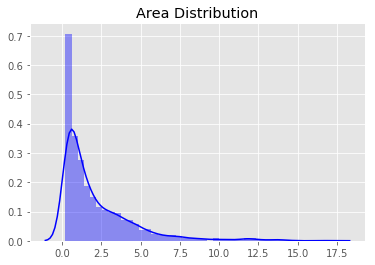

In [107]:
area_dist(0,888)

In [26]:
conn = sqlite3.connect("blobs_CMOD")
c = conn.cursor()
for row in c.execute("SELECT ROWID,* FROM t_"+str(100)):
    print(row)

(1, 0.4109873426244968, 78.0, 78.0, None, None, None, None, None, None, None, None)


In [39]:
def amplitude_dist(time_start,time_end):
    conn = sqlite3.connect("blobs_CMOD")
    c = conn.cursor()
    
    amplitudes = []
    for time in range(time_start,time_end):
        for row in c.execute("SELECT ROWID,* FROM t_"+str(time)):
            if ~pd.isnull(row[1]) and row[4] is not None:
                amplitudes.append(row[1])
            else:
                pass
    plt.title("Amplitude distribution")
    #plt.hist(amplitudes,bins='auto',density=True)
    sns.distplot(amplitudes,color='blue',hist=True,kde=True)
    plt.show()

C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


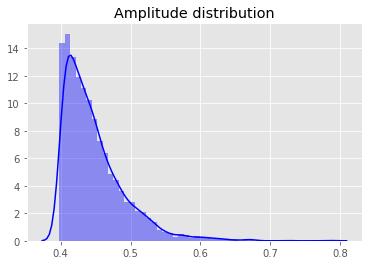

In [40]:
amplitude_dist(0,888)

In [5]:
H = blobs.blob_history(0,887)

In [6]:
H.shape

(354, 888)

In [11]:
reload(blobs)

<module 'blobs' from 'C:\\Users\\Giannis\\Desktop\\Python_scrpts\\blobs.py'>

In [12]:
blobs.longest_blob(H)

(251, 14, 183, 13, 78, 12, 50, 10)

In [15]:
%%capture
art_ani = blobs.blob_animation(arr_all,H,251,0)

In [23]:
HTML(art_ani.to_html5_video())

In [48]:
H[50,670:725]

array([0, 1, 3, 1, 1, 5, 7, 4, 2, 2, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [50]:
x = blobs.Rmin+blobs.unitR*63
y = blobs.Zmin+blobs.unitZ*38
print(x,y)

0.89764 -0.024000000000000007


In [49]:
conn = sqlite3.connect("blobs_CMOD3")
c = conn.cursor()
for row in c.execute("SELECT ROWID,* FROM t_"+str(671)):
    print(row)

(1, 0.34422480745998674, 63.0, 38.0, 0.03917327790925462, 0.2999999999999999, 62.423698231786894, 38.46933319444661, 0.012302965995564335, 2.292033677296853, 1.0581773847792806, 0.36297508004045337)
(2, 0.3205267375543697, 64.0, 48.0, 0.025829789115638935, 0.30000000000000016, 63.67760516067562, 48.22249672025563, -0.34059063565597686, 1.6355911762915907, 0.9840427404256742, 0.14032166752375028)
(3, 0.3438099250302064, 61.0, 57.0, 0.04398728470494939, 0.30000000000000016, 61.00709280608276, 57.40449741529995, -0.16581063616236158, 1.7859436601058507, 1.5009336929256416, 0.22441001105979635)


In [51]:
def velocity_distributions(H):
    conn = sqlite3.connect("blobs_CMOD")
    c = conn.cursor()
    vR_l = []
    vZ_l = []
    vPSI_l = []
    vPOL_l = []
    for row in H:
        if np.count_nonzero(row)>=2:
            fnz = next((i for i,x in enumerate(row) if x),None)
            ind = 0
            vR_temp = []
            vZ_temp = []
            vPSI_temp = []
            vPOL_temp = []
            while fnz+ind+1<len(row) and row[fnz+ind+1]!=0:
                c.execute("SELECT ROWID,* FROM t_"+str(fnz+ind)+" WHERE ROWID="+str(int(row[fnz+ind])))
                blobA = c.fetchall()[0]
                c.execute("SELECT ROWID,* FROM t_"+str(fnz+ind+1)+" WHERE ROWID="+str(int(row[fnz+ind+1])))
                blobB = c.fetchall()[0]
                ind = ind+1
                vR = ((blobB[6]-blobA[6])*blobs.unitR)/blobs.dt
                vZ = ((blobB[7]-blobA[7])*blobs.unitZ)/blobs.dt
                Br = (blobs.BR[int(blobA[3])][int(blobA[2])]+blobs.BR[int(blobB[3])][int(blobB[2])])/2
                Bz = (blobs.BZ[int(blobA[3])][int(blobA[2])]+blobs.BZ[int(blobB[3])][int(blobB[2])])/2
                Bpol = (blobs.Bp[int(blobA[3])][int(blobA[2])]+blobs.Bp[int(blobB[3])][int(blobB[2])])/2
    
                V_psi = vR*(Bz/Bpol) - vZ*(Br/Bpol)
                V_pol = vR*(Br/Bpol) + vZ*(Bz/Bpol)
                vR_temp.append(vR)
                vZ_temp.append(vZ)
                vPSI_temp.append(V_psi)
                vPOL_temp.append(V_pol)
            vR_l.append(np.mean(vR_temp))
            vZ_l.append(np.mean(vZ_temp))
            vPSI_l.append(np.mean(vPSI_temp))
            vPOL_l.append(np.mean(vPOL_temp))
    fig, ((ax1,ax2),(ax3,ax4)) = plt.subplots(2,2, figsize=(20,20))
    ax1.set_title(r"$V_R$ distribution")
    ax1.hist(vR_l,bins='auto',color='blue')
    #ax1 = sns.distplot(vR_l,hist=True,kde=True)
    ax1.set_xlabel(r"$\frac{m}{s}$",fontsize=20)
    ax2.set_title(r"$V_Z$ distribution")
    ax2.hist(vZ_l,bins='auto',color='blue')
    #ax2 = sns.distplot(vZ_l,hist=True,kde=True)
    ax2.set_xlabel(r"$\frac{m}{s}$",fontsize=20)
    ax3.set_title("Radial velocity distribution")
    ax3.hist(vPSI_l,bins='auto',color='blue')
    #ax3 = sns.distplot(vPSI_l,hist=True,kde=True)
    ax3.set_xlabel(r"$\frac{m}{s}$",fontsize=20)
    ax4.set_title("Poloidal velocity distribution")
    ax4.hist(vPOL_l,bins='auto',color='blue')
    #ax4 = sns.distplot(vPOL_l,hist=True,kde=True)
    ax4.set_xlabel(r"$\frac{m}{s}$",fontsize=20)
    plt.show()
            

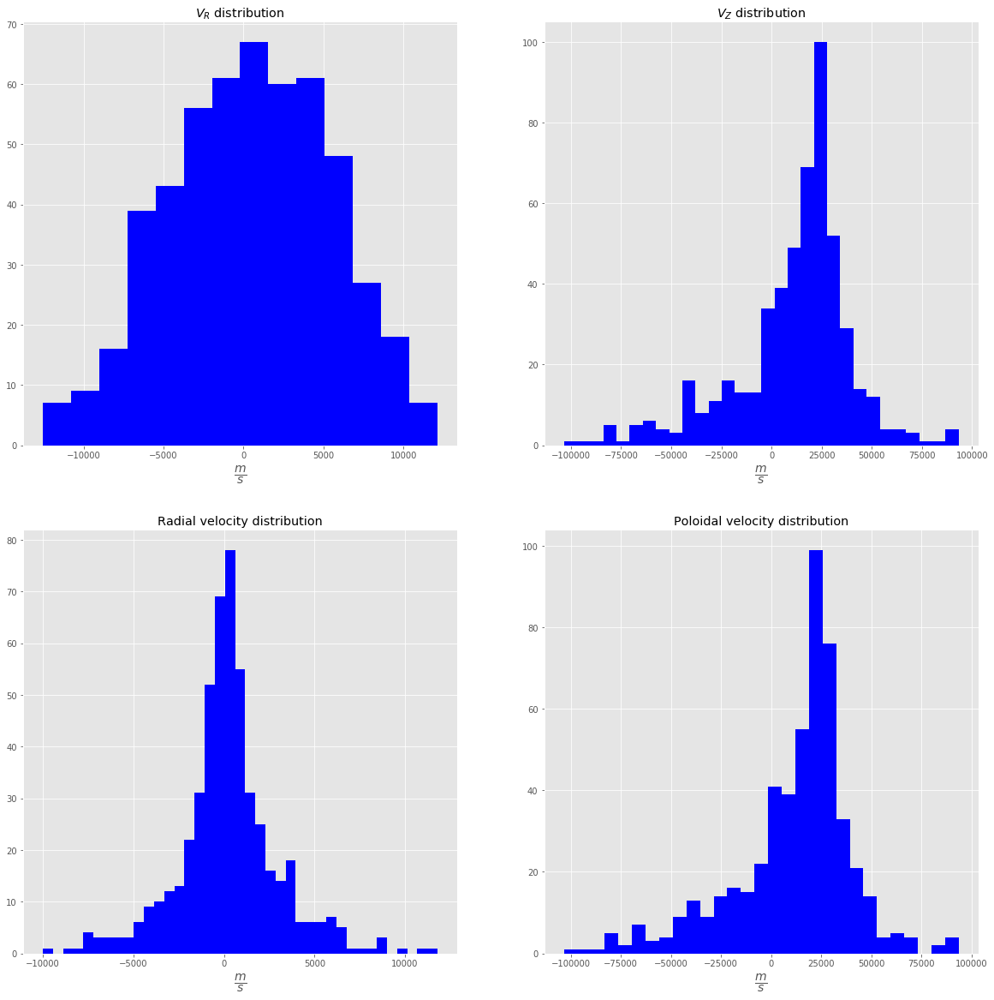

In [52]:
velocity_distributions(H)

In [49]:
def total_velocity_distributions(H):
    conn = sqlite3.connect("blobs_CMOD")
    c = conn.cursor()
    vR_l = []
    vZ_l = []
    vPSI_l = []
    vPOL_l = []
    for row in H:
        if np.count_nonzero(row)>=2:
            fnz = next((i for i,x in enumerate(row) if x),None)
            ind = 0
            
            while fnz+ind+1<len(row) and row[fnz+ind+1]!=0:
                c.execute("SELECT ROWID,* FROM t_"+str(fnz+ind)+" WHERE ROWID="+str(int(row[fnz+ind])))
                blobA = c.fetchall()[0]
                c.execute("SELECT ROWID,* FROM t_"+str(fnz+ind+1)+" WHERE ROWID="+str(int(row[fnz+ind+1])))
                blobB = c.fetchall()[0]
                ind = ind+1
                vR = ((blobB[6]-blobA[6])*blobs.unitR)/blobs.dt
                vZ = ((blobB[7]-blobA[7])*blobs.unitZ)/blobs.dt
                Br = (blobs.BR[int(blobA[3])][int(blobA[2])]+blobs.BR[int(blobB[3])][int(blobB[2])])/2
                Bz = (blobs.BZ[int(blobA[3])][int(blobA[2])]+blobs.BZ[int(blobB[3])][int(blobB[2])])/2
                Bpol = (blobs.Bp[int(blobA[3])][int(blobA[2])]+blobs.Bp[int(blobB[3])][int(blobB[2])])/2
    
                V_psi = vR*(Bz/Bpol) - vZ*(Br/Bpol)
                V_pol = vR*(Br/Bpol) + vZ*(Bz/Bpol)
                vR_l.append(vR)
                vZ_l.append(vZ)
                vPSI_l.append(V_psi)
                vPOL_l.append(V_pol)
    fig, ((ax1,ax2),(ax3,ax4)) = plt.subplots(2,2, figsize=(20,20))
    ax1.set_title(r"$V_R$ distribution")
    ax1.hist(vR_l,bins='auto',color='blue')
    #ax1 = sns.distplot(vR_l,hist=True,kde=True)
    ax1.set_xlabel(r"$\frac{m}{s}$",fontsize=20)
    ax2.set_title(r"$V_Z$ distribution")
    ax2.hist(vZ_l,bins='auto',color='blue')
    #ax2 = sns.distplot(vZ_l,hist=True,kde=True)
    ax2.set_xlabel(r"$\frac{m}{s}$",fontsize=20)
    ax3.set_title("Radial velocity distribution")
    ax3.hist(vPSI_l,bins='auto',color='blue')
    #ax3 = sns.distplot(vPSI_l,hist=True,kde=True)
    ax3.set_xlabel(r"$\frac{m}{s}$",fontsize=20)
    ax4.set_title("Poloidal velocity distribution")
    ax4.hist(vPOL_l,bins='auto',color='blue')
    #ax4 = sns.distplot(vPOL_l,hist=True,kde=True)
    ax4.set_xlabel(r"$\frac{m}{s}$",fontsize=20)
    plt.show()
            

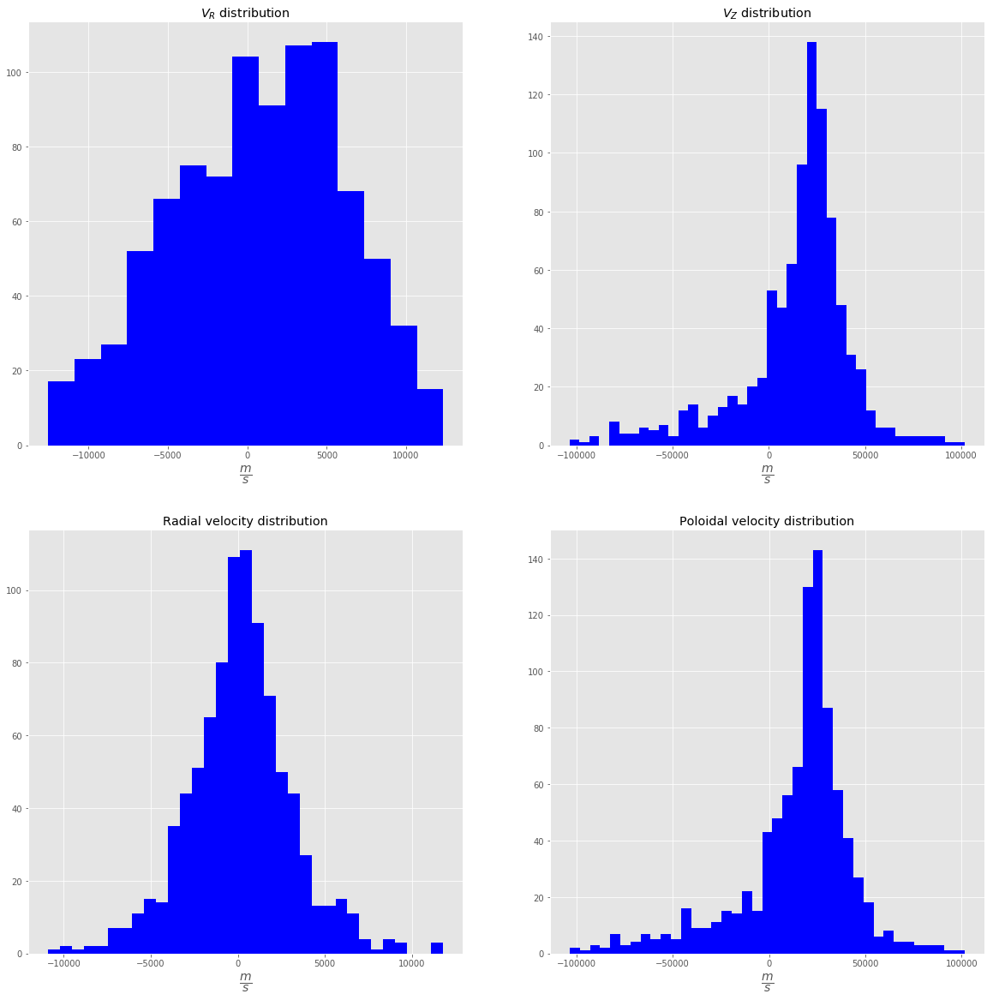

In [50]:
total_velocity_distributions(H)

In [83]:
def area_dist_persistance(H):
    conn = sqlite3.connect("blobs_CMOD")
    c = conn.cursor()
    areas = []
    areas2 = []
    areas3 = []
    areas4 = []
    areas5 = []
    areas6 = []
    for time in range(0,888):
        for row in c.execute("SELECT ROWID,* FROM t_"+str(time)):
            if ~pd.isnull(row[4]) and row[4] is not None and row[4]>0.2:
                areas.append(row[4])
    for row in H:
        if np.count_nonzero(row)==2:
            fnz = next((i for i,x in enumerate(row) if x),None)
            for i in range(2):
                c.execute("SELECT ROWID,* FROM t_"+str(fnz+i)+" WHERE ROWID="+str(int(row[fnz+i])))
                blob = c.fetchall()[0]
                if ~pd.isnull(blob[4]) and blob[4] is not None and blob[4]>0.2:
                    areas2.append(blob[4])
        if np.count_nonzero(row)==3:
            fnz = next((i for i,x in enumerate(row) if x),None)
            for i in range(3):
                c.execute("SELECT ROWID,* FROM t_"+str(fnz+i)+" WHERE ROWID="+str(int(row[fnz+i])))
                blob = c.fetchall()[0]
                if ~pd.isnull(blob[4]) and blob[4] is not None and blob[4]>0.2:
                    areas3.append(blob[4])
        if np.count_nonzero(row)==4:
            fnz = next((i for i,x in enumerate(row) if x),None)
            for i in range(4):
                c.execute("SELECT ROWID,* FROM t_"+str(fnz+i)+" WHERE ROWID="+str(int(row[fnz+i])))
                blob = c.fetchall()[0]
                if ~pd.isnull(blob[4]) and blob[4] is not None and blob[4]>0.2:
                    areas4.append(blob[4])
        if np.count_nonzero(row)==5:
            fnz = next((i for i,x in enumerate(row) if x),None)
            for i in range(5):
                c.execute("SELECT ROWID,* FROM t_"+str(fnz+i)+" WHERE ROWID="+str(int(row[fnz+i])))
                blob = c.fetchall()[0]
                if ~pd.isnull(blob[4]) and blob[4] is not None and blob[4]>0.2:
                    areas5.append(blob[4])
        if np.count_nonzero(row)==6:
            fnz = next((i for i,x in enumerate(row) if x),None)
            for i in range(6):
                c.execute("SELECT ROWID,* FROM t_"+str(fnz+i)+" WHERE ROWID="+str(int(row[fnz+i])))
                blob = c.fetchall()[0]
                if ~pd.isnull(blob[4]) and blob[4] is not None and blob[4]>0.2:
                    areas6.append(blob[4])
    plt.figure(figsize = (10,10))
    plt.title("Area distribution vs. persistance")    
    #plt.hist(areas,bins='auto',label='all')
    #plt.hist(areas2,bins='auto',label='t=2')
    #plt.hist(areas3,bins='auto',label='t=3')
    #plt.hist(areas4,bins='auto',label='t=4')
    #plt.hist(areas5,bins='auto',label='t=5')
    #plt.hist(areas6,bins='auto',label='t=6')
    sns.distplot(areas,hist=True,kde=True,label='all')
    sns.distplot(areas2,hist=True,kde=True,label='t=2')
    sns.distplot(areas3,hist=True,kde=True,label='t=3')
    sns.distplot(areas4,hist=True,kde=True,label='t=4')
    sns.distplot(areas5,hist=True,kde=True,label='t=5')
    sns.distplot(areas6,hist=True,kde=True,label='t=6')
    plt.legend()
    plt.show()

C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' 

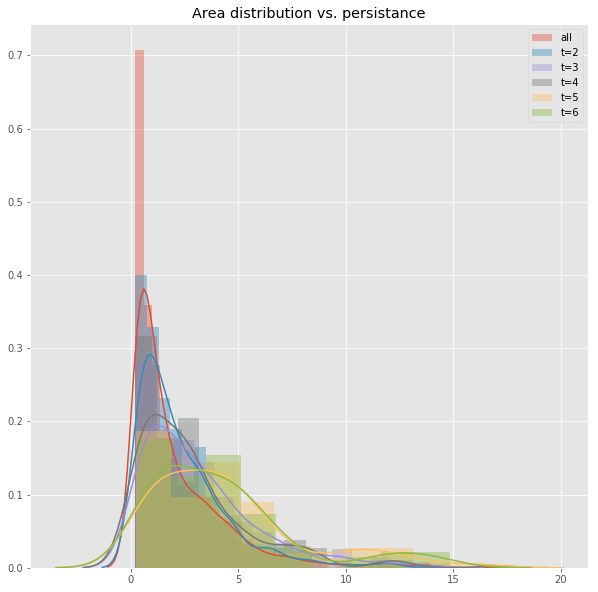

In [84]:
area_dist_persistance(H)

In [81]:
def amplitude_dist_persistance(H):
    conn = sqlite3.connect("blobs_CMOD")
    c = conn.cursor()
    ampl = []
    ampl2 = []
    ampl3 = []
    ampl4 = []
    ampl5 = []
    ampl6 = []
    for time in range(0,888):
        for row in c.execute("SELECT ROWID,* FROM t_"+str(time)):
            if ~pd.isnull(row[1]) and row[4] is not None and row[4]>0.2:
                ampl.append(row[1])
    for row in H:
        if np.count_nonzero(row)==2:
            fnz = next((i for i,x in enumerate(row) if x),None)
            for i in range(2):
                c.execute("SELECT ROWID,* FROM t_"+str(fnz+i)+" WHERE ROWID="+str(int(row[fnz+i])))
                blob = c.fetchall()[0]
                if ~pd.isnull(blob[1]) and blob[1] is not None and blob[4]>0.2:
                    ampl2.append(blob[1])
        if np.count_nonzero(row)==3:
            fnz = next((i for i,x in enumerate(row) if x),None)
            for i in range(3):
                c.execute("SELECT ROWID,* FROM t_"+str(fnz+i)+" WHERE ROWID="+str(int(row[fnz+i])))
                blob = c.fetchall()[0]
                if ~pd.isnull(blob[1]) and blob[1] is not None and blob[4]>0.2:
                    ampl3.append(blob[1])
        if np.count_nonzero(row)==4:
            fnz = next((i for i,x in enumerate(row) if x),None)
            for i in range(4):
                c.execute("SELECT ROWID,* FROM t_"+str(fnz+i)+" WHERE ROWID="+str(int(row[fnz+i])))
                blob = c.fetchall()[0]
                if ~pd.isnull(blob[1]) and blob[1] is not None and blob[4]>0.2:
                    ampl4.append(blob[1])
        if np.count_nonzero(row)==5:
            fnz = next((i for i,x in enumerate(row) if x),None)
            for i in range(5):
                c.execute("SELECT ROWID,* FROM t_"+str(fnz+i)+" WHERE ROWID="+str(int(row[fnz+i])))
                blob = c.fetchall()[0]
                if ~pd.isnull(blob[1]) and blob[1] is not None and blob[4]>0.2:
                    ampl5.append(blob[1])
        if np.count_nonzero(row)==6:
            fnz = next((i for i,x in enumerate(row) if x),None)
            for i in range(6):
                c.execute("SELECT ROWID,* FROM t_"+str(fnz+i)+" WHERE ROWID="+str(int(row[fnz+i])))
                blob = c.fetchall()[0]
                if ~pd.isnull(blob[1]) and blob[1] is not None and blob[4]>0.2:
                    ampl6.append(blob[1])
    plt.figure(figsize = (10,10))
    plt.title("Amplitude distribution vs. persistance")    
    #plt.hist(areas,bins='auto',label='all')
    #plt.hist(areas2,bins='auto',label='t=2')
    #plt.hist(areas3,bins='auto',label='t=3')
    #plt.hist(areas4,bins='auto',label='t=4')
    #plt.hist(areas5,bins='auto',label='t=5')
    #plt.hist(areas6,bins='auto',label='t=6')
    
    sns.distplot(ampl,hist=True,kde=True,label='all')
    sns.distplot(ampl2,hist=True,kde=True,label='t=2')
    sns.distplot(ampl3,hist=True,kde=True,label='t=3')
    sns.distplot(ampl4,hist=True,kde=True,label='t=4')
    sns.distplot(ampl5,hist=True,kde=True,label='t=5')
    sns.distplot(ampl6,hist=True,kde=True,label='t=6')
    plt.legend()
    plt.show()

C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' 

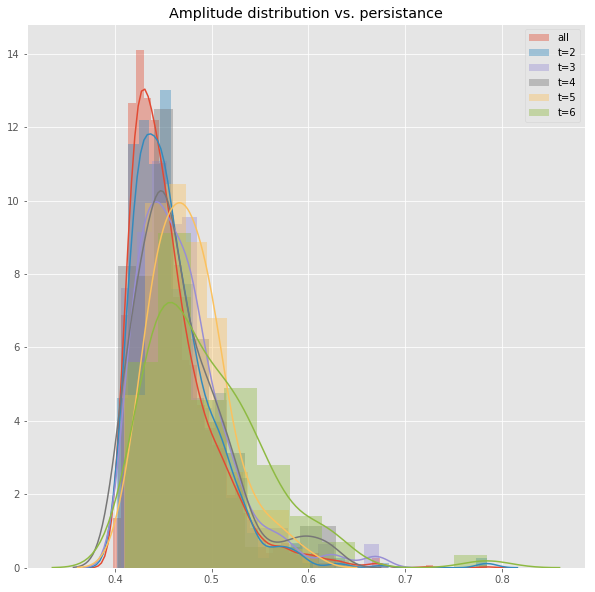

In [82]:
amplitude_dist_persistance(H)

In [99]:
def amplitude_velocity(H):
    conn = sqlite3.connect("blobs_CMOD")
    c = conn.cursor()
    vPSI_l = []
    vPOL_l = []
    ampl = []
    area = []
    for row in H:
        if np.count_nonzero(row)>=3:
            fnz = next((i for i,x in enumerate(row) if x),None)
            ind = 0
            while fnz+ind+1<len(row) and row[fnz+ind+1]!=0:
                c.execute("SELECT ROWID,* FROM t_"+str(fnz+ind)+" WHERE ROWID="+str(int(row[fnz+ind])))
                blobA = c.fetchall()[0]
                c.execute("SELECT ROWID,* FROM t_"+str(fnz+ind+1)+" WHERE ROWID="+str(int(row[fnz+ind+1])))
                blobB = c.fetchall()[0]
                ind = ind+1
                vR = ((blobB[6]-blobA[6])*blobs.unitR)/blobs.dt
                vZ = ((blobB[7]-blobA[7])*blobs.unitZ)/blobs.dt
                Br = (blobs.BR[int(blobA[3])][int(blobA[2])]+blobs.BR[int(blobB[3])][int(blobB[2])])/2
                Bz = (blobs.BZ[int(blobA[3])][int(blobA[2])]+blobs.BZ[int(blobB[3])][int(blobB[2])])/2
                Bpol = (blobs.Bp[int(blobA[3])][int(blobA[2])]+blobs.Bp[int(blobB[3])][int(blobB[2])])/2
    
                V_psi = vR*(Bz/Bpol) - vZ*(Br/Bpol)
                V_pol = vR*(Br/Bpol) + vZ*(Bz/Bpol)
                if blobA[1]>=0.5:
                    vPSI_l.append(V_psi)
                    vPOL_l.append(V_pol)
                    ampl.append(blobA[1])
                    area.append(blobA[4])
                else:
                    pass
                
    fig, ((ax1,ax2),(ax3,ax4),(ax5,ax6)) = plt.subplots(3,2, figsize=(20,20))
    ax1.scatter(ampl,vPSI_l)
    ax1.set_ylabel(r'$V_{\psi}$',fontsize=20)
    ax1.set_xlabel('Amplitude',fontsize=20)
    ax2.scatter(ampl,vPOL_l)
    ax2.set_ylabel(r'$V_{\theta}$',fontsize=20)
    ax2.set_xlabel(r'Amplitude',fontsize=20)
    ax3.scatter(area,vPSI_l)
    ax3.set_ylabel(r'$V_{\psi}$',fontsize=20)
    ax3.set_xlabel('Area',fontsize=20)
    ax4.scatter(area,vPOL_l)
    ax4.set_ylabel(r'$V_{\theta}$',fontsize=20)
    ax4.set_xlabel('Area',fontsize=20)
    ax5.scatter(area,ampl)
    ax6.scatter(area,ampl)
    plt.show()

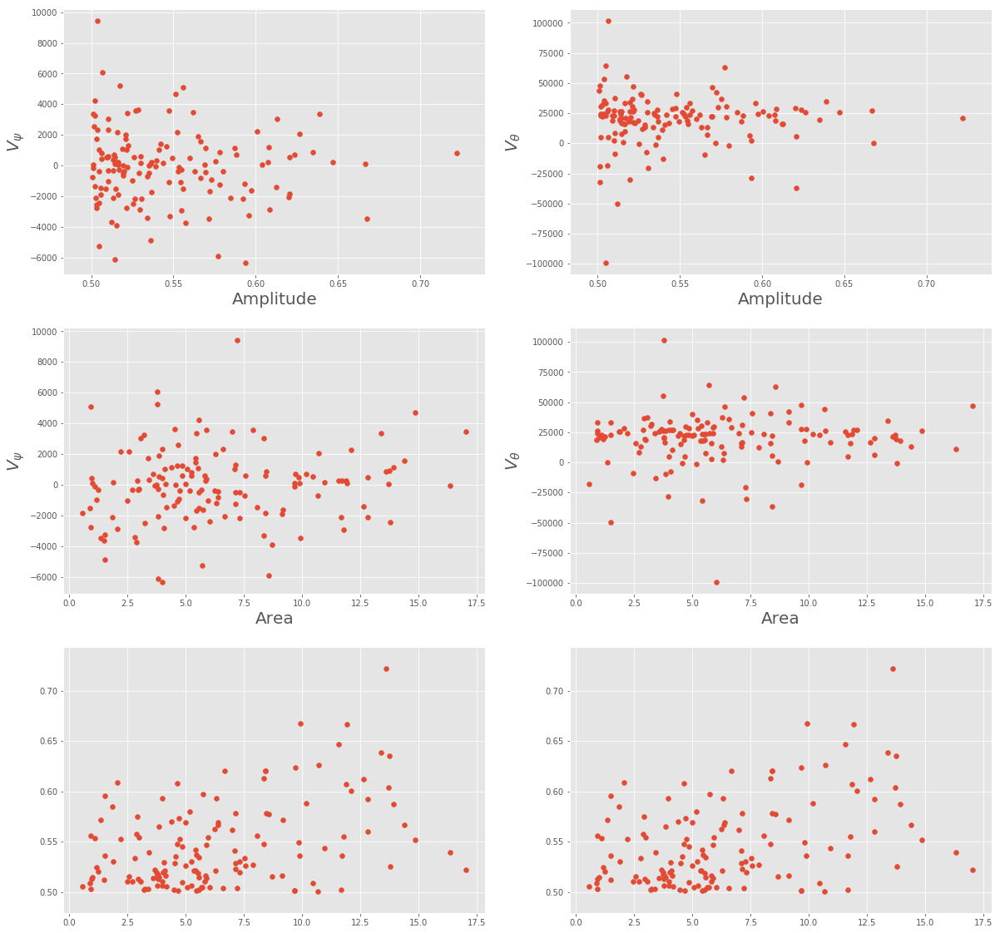

In [100]:
amplitude_velocity(H)

In [112]:
def velocity_persistance_distributions(H):
    conn = sqlite3.connect("blobs_CMOD")
    c = conn.cursor()
    vPSI_2 = []
    vPSI_3 = []
    vPSI_4 = []
    vPSI_5 = []
    vPSI_6 = []
    for row in H:
        if np.count_nonzero(row)==2:
            fnz = next((i for i,x in enumerate(row) if x),None)
            ind = 0
            
            while fnz+ind+1<len(row) and row[fnz+ind+1]!=0:
                c.execute("SELECT ROWID,* FROM t_"+str(fnz+ind)+" WHERE ROWID="+str(int(row[fnz+ind])))
                blobA = c.fetchall()[0]
                c.execute("SELECT ROWID,* FROM t_"+str(fnz+ind+1)+" WHERE ROWID="+str(int(row[fnz+ind+1])))
                blobB = c.fetchall()[0]
                ind = ind+1
                vR = ((blobB[6]-blobA[6])*blobs.unitR)/blobs.dt
                vZ = ((blobB[7]-blobA[7])*blobs.unitZ)/blobs.dt
                Br = (blobs.BR[int(blobA[3])][int(blobA[2])]+blobs.BR[int(blobB[3])][int(blobB[2])])/2
                Bz = (blobs.BZ[int(blobA[3])][int(blobA[2])]+blobs.BZ[int(blobB[3])][int(blobB[2])])/2
                Bpol = (blobs.Bp[int(blobA[3])][int(blobA[2])]+blobs.Bp[int(blobB[3])][int(blobB[2])])/2
    
                V_psi = vR*(Bz/Bpol) - vZ*(Br/Bpol)
                vPSI_2.append(V_psi)
        if np.count_nonzero(row)==3:
            fnz = next((i for i,x in enumerate(row) if x),None)
            ind = 0
            
            while fnz+ind+1<len(row) and row[fnz+ind+1]!=0:
                c.execute("SELECT ROWID,* FROM t_"+str(fnz+ind)+" WHERE ROWID="+str(int(row[fnz+ind])))
                blobA = c.fetchall()[0]
                c.execute("SELECT ROWID,* FROM t_"+str(fnz+ind+1)+" WHERE ROWID="+str(int(row[fnz+ind+1])))
                blobB = c.fetchall()[0]
                ind = ind+1
                vR = ((blobB[6]-blobA[6])*blobs.unitR)/blobs.dt
                vZ = ((blobB[7]-blobA[7])*blobs.unitZ)/blobs.dt
                Br = (blobs.BR[int(blobA[3])][int(blobA[2])]+blobs.BR[int(blobB[3])][int(blobB[2])])/2
                Bz = (blobs.BZ[int(blobA[3])][int(blobA[2])]+blobs.BZ[int(blobB[3])][int(blobB[2])])/2
                Bpol = (blobs.Bp[int(blobA[3])][int(blobA[2])]+blobs.Bp[int(blobB[3])][int(blobB[2])])/2
    
                V_psi = vR*(Bz/Bpol) - vZ*(Br/Bpol)
                vPSI_3.append(V_psi)
        if np.count_nonzero(row)==4:
            fnz = next((i for i,x in enumerate(row) if x),None)
            ind = 0
            
            while fnz+ind+1<len(row) and row[fnz+ind+1]!=0:
                c.execute("SELECT ROWID,* FROM t_"+str(fnz+ind)+" WHERE ROWID="+str(int(row[fnz+ind])))
                blobA = c.fetchall()[0]
                c.execute("SELECT ROWID,* FROM t_"+str(fnz+ind+1)+" WHERE ROWID="+str(int(row[fnz+ind+1])))
                blobB = c.fetchall()[0]
                ind = ind+1
                vR = ((blobB[6]-blobA[6])*blobs.unitR)/blobs.dt
                vZ = ((blobB[7]-blobA[7])*blobs.unitZ)/blobs.dt
                Br = (blobs.BR[int(blobA[3])][int(blobA[2])]+blobs.BR[int(blobB[3])][int(blobB[2])])/2
                Bz = (blobs.BZ[int(blobA[3])][int(blobA[2])]+blobs.BZ[int(blobB[3])][int(blobB[2])])/2
                Bpol = (blobs.Bp[int(blobA[3])][int(blobA[2])]+blobs.Bp[int(blobB[3])][int(blobB[2])])/2
    
                V_psi = vR*(Bz/Bpol) - vZ*(Br/Bpol)
                vPSI_4.append(V_psi)
        if np.count_nonzero(row)==5:
            fnz = next((i for i,x in enumerate(row) if x),None)
            ind = 0
            
            while fnz+ind+1<len(row) and row[fnz+ind+1]!=0:
                c.execute("SELECT ROWID,* FROM t_"+str(fnz+ind)+" WHERE ROWID="+str(int(row[fnz+ind])))
                blobA = c.fetchall()[0]
                c.execute("SELECT ROWID,* FROM t_"+str(fnz+ind+1)+" WHERE ROWID="+str(int(row[fnz+ind+1])))
                blobB = c.fetchall()[0]
                ind = ind+1
                vR = ((blobB[6]-blobA[6])*blobs.unitR)/blobs.dt
                vZ = ((blobB[7]-blobA[7])*blobs.unitZ)/blobs.dt
                Br = (blobs.BR[int(blobA[3])][int(blobA[2])]+blobs.BR[int(blobB[3])][int(blobB[2])])/2
                Bz = (blobs.BZ[int(blobA[3])][int(blobA[2])]+blobs.BZ[int(blobB[3])][int(blobB[2])])/2
                Bpol = (blobs.Bp[int(blobA[3])][int(blobA[2])]+blobs.Bp[int(blobB[3])][int(blobB[2])])/2
    
                V_psi = vR*(Bz/Bpol) - vZ*(Br/Bpol)
                vPSI_5.append(V_psi)
        if np.count_nonzero(row)==6:
            fnz = next((i for i,x in enumerate(row) if x),None)
            ind = 0
            
            while fnz+ind+1<len(row) and row[fnz+ind+1]!=0:
                c.execute("SELECT ROWID,* FROM t_"+str(fnz+ind)+" WHERE ROWID="+str(int(row[fnz+ind])))
                blobA = c.fetchall()[0]
                c.execute("SELECT ROWID,* FROM t_"+str(fnz+ind+1)+" WHERE ROWID="+str(int(row[fnz+ind+1])))
                blobB = c.fetchall()[0]
                ind = ind+1
                vR = ((blobB[6]-blobA[6])*blobs.unitR)/blobs.dt
                vZ = ((blobB[7]-blobA[7])*blobs.unitZ)/blobs.dt
                Br = (blobs.BR[int(blobA[3])][int(blobA[2])]+blobs.BR[int(blobB[3])][int(blobB[2])])/2
                Bz = (blobs.BZ[int(blobA[3])][int(blobA[2])]+blobs.BZ[int(blobB[3])][int(blobB[2])])/2
                Bpol = (blobs.Bp[int(blobA[3])][int(blobA[2])]+blobs.Bp[int(blobB[3])][int(blobB[2])])/2
    
                V_psi = vR*(Bz/Bpol) - vZ*(Br/Bpol)
                vPSI_6.append(V_psi)
                
    plt.figure(figsize = (10,5))
    plt.title("Radial velocity distribution vs. persistance")    
    sns.distplot(vPSI_2,hist=True,kde=True,label='t=2')
    sns.distplot(vPSI_3,hist=True,kde=True,label='t=3')
    sns.distplot(vPSI_4,hist=True,kde=True,label='t=4')
    sns.distplot(vPSI_5,hist=True,kde=True,label='t=5')
    sns.distplot(vPSI_6,hist=True,kde=True,label='t=6')
    plt.legend()
    plt.show()

C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' 

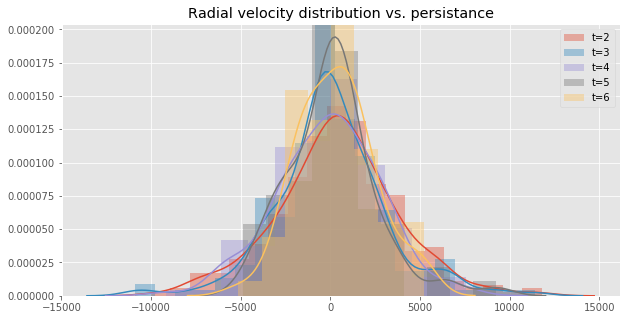

In [113]:
velocity_persistance_distributions(H)

### DataBase with Area in cm^2

In [156]:
reload(blobs)

<module 'blobs' from 'C:\\Users\\Giannis\\Desktop\\Python_scrpts\\blobs.py'>

In [139]:
#blobs.db_creation(arr_all,0,888,0.3,0.99)

C:\Users\Giannis\Desktop\Python_scrpts\blobs.py:552: RuntimeWarning: invalid value encountered in sqrt
  res1=np.sqrt(up/down1)
C:\Users\Giannis\Desktop\Python_scrpts\blobs.py:553: RuntimeWarning: invalid value encountered in sqrt
  res2=np.sqrt(up/down2)


In [147]:
H1=blobs.blob_history(0,887)

In [148]:
H1.shape

(3375, 888)

C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


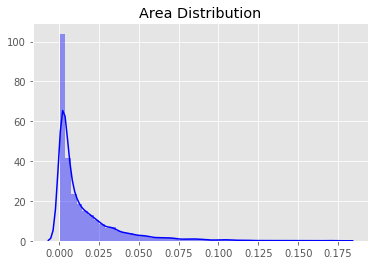

In [149]:
blobs.area_dist(0,887)

C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


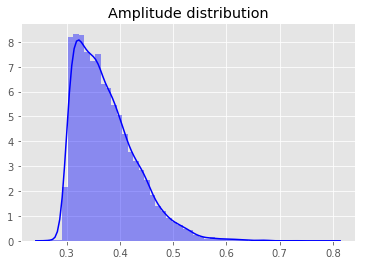

In [150]:
blobs.amplitude_dist(0,887)

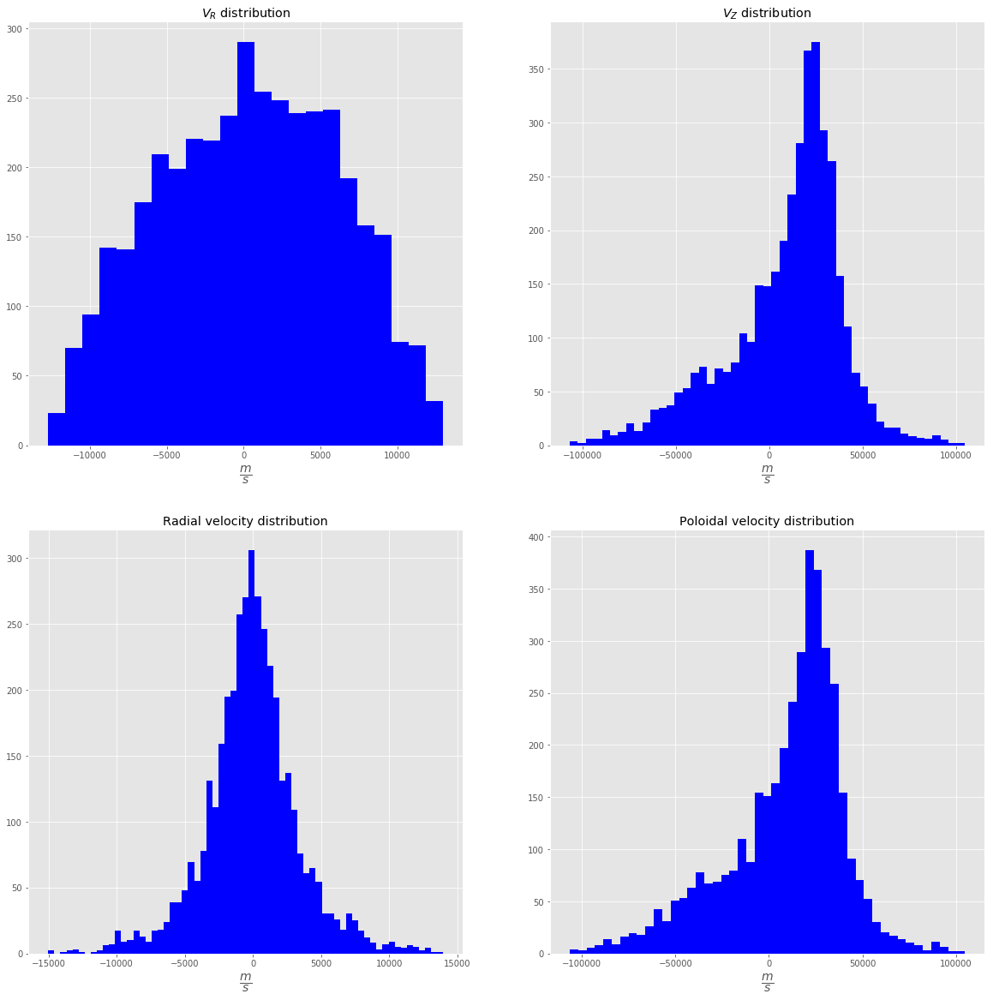

In [151]:
blobs.total_velocity_distributions(H1)

C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' 

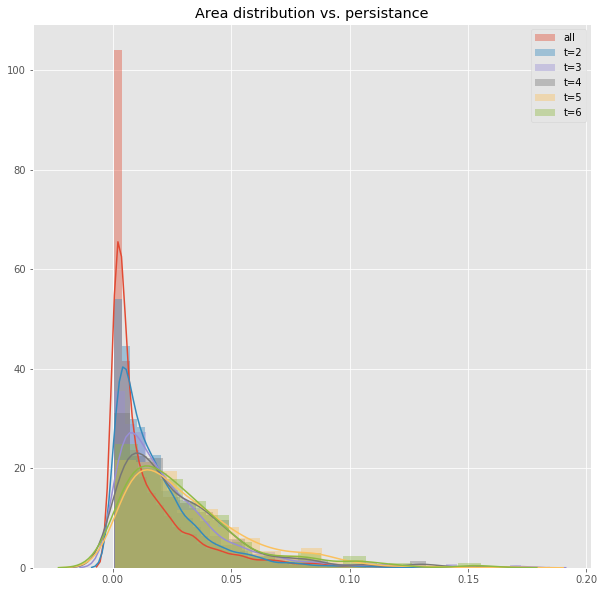

In [152]:
blobs.area_dist_persistance(H1)

C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' 

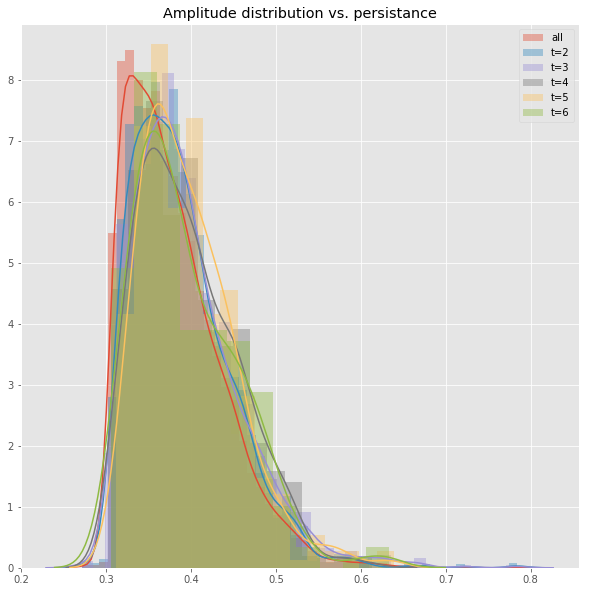

In [158]:
blobs.amplitude_dist_persistance(H1)

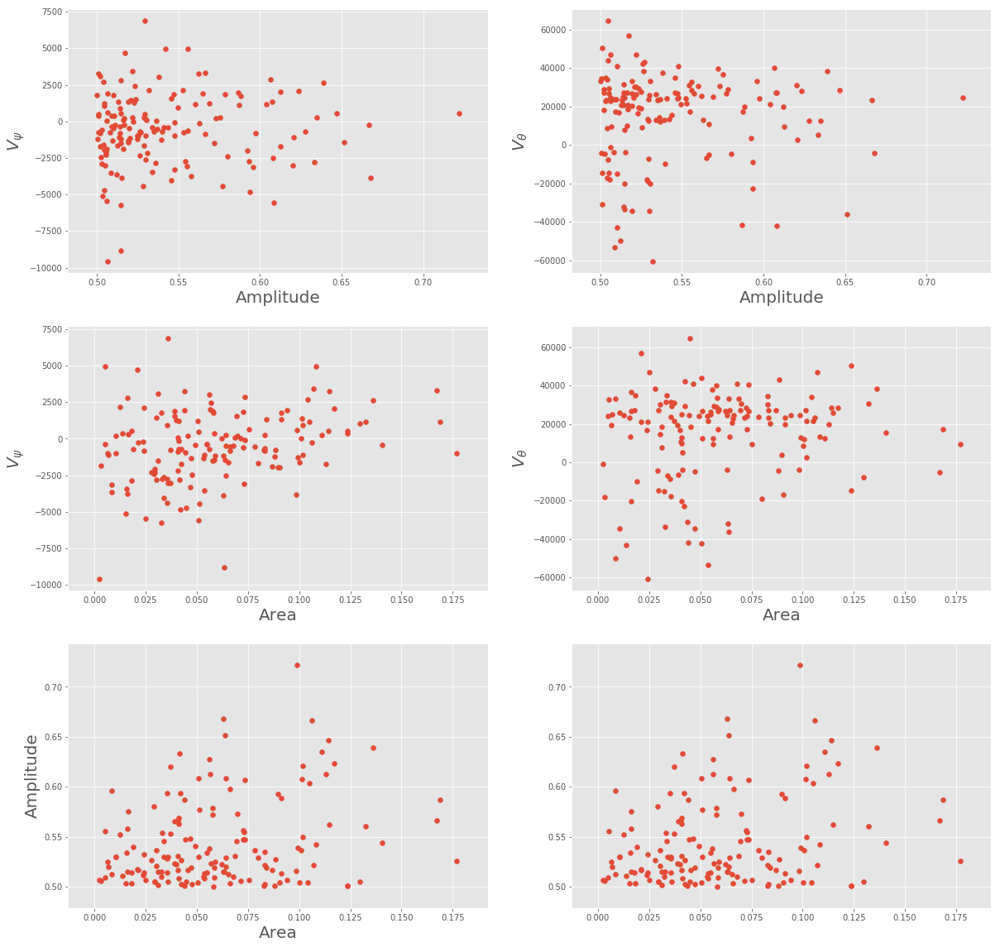

In [159]:
blobs.amplitude_velocity(H1)

C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' 

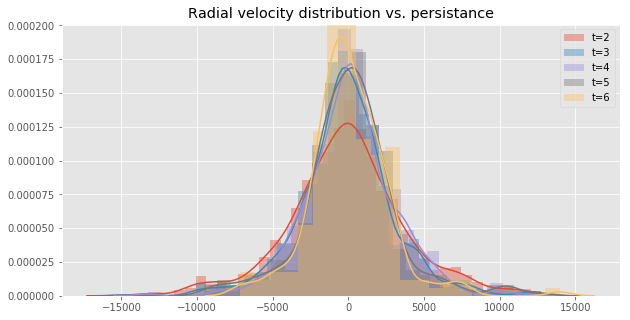

In [160]:
blobs.velocity_persistance_distributions(H1)

### Database distributions with 2 smoothings

In [2]:
blobs.unit_area

5.600000000000005e-07

In [161]:
reload(blobs)

<module 'blobs' from 'C:\\Users\\Giannis\\Desktop\\Python_scrpts\\blobs.py'>

In [162]:
#blobs.db_creation(arr_all,0,888,0.3,0.99)

C:\Users\Giannis\Desktop\Python_scrpts\blobs.py:555: RuntimeWarning: invalid value encountered in sqrt
  res2=np.sqrt(up/down2)
C:\Users\Giannis\Desktop\Python_scrpts\blobs.py:556: RuntimeWarning: invalid value encountered in sqrt
  return np.real(np.array([res1, res2]))


In [164]:
H2 = blobs.blob_history(0,887)

In [165]:
H2.shape

(1116, 888)

C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


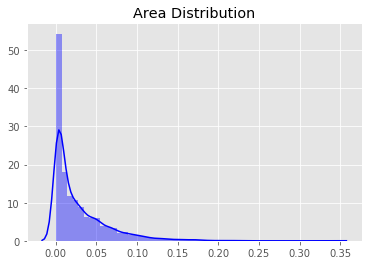

In [166]:
blobs.area_dist(0,887)

C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


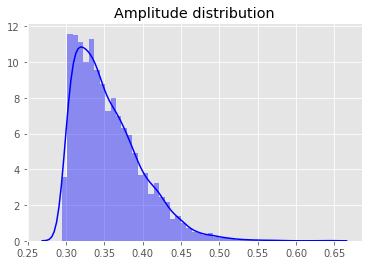

In [167]:
blobs.amplitude_dist(0,887)

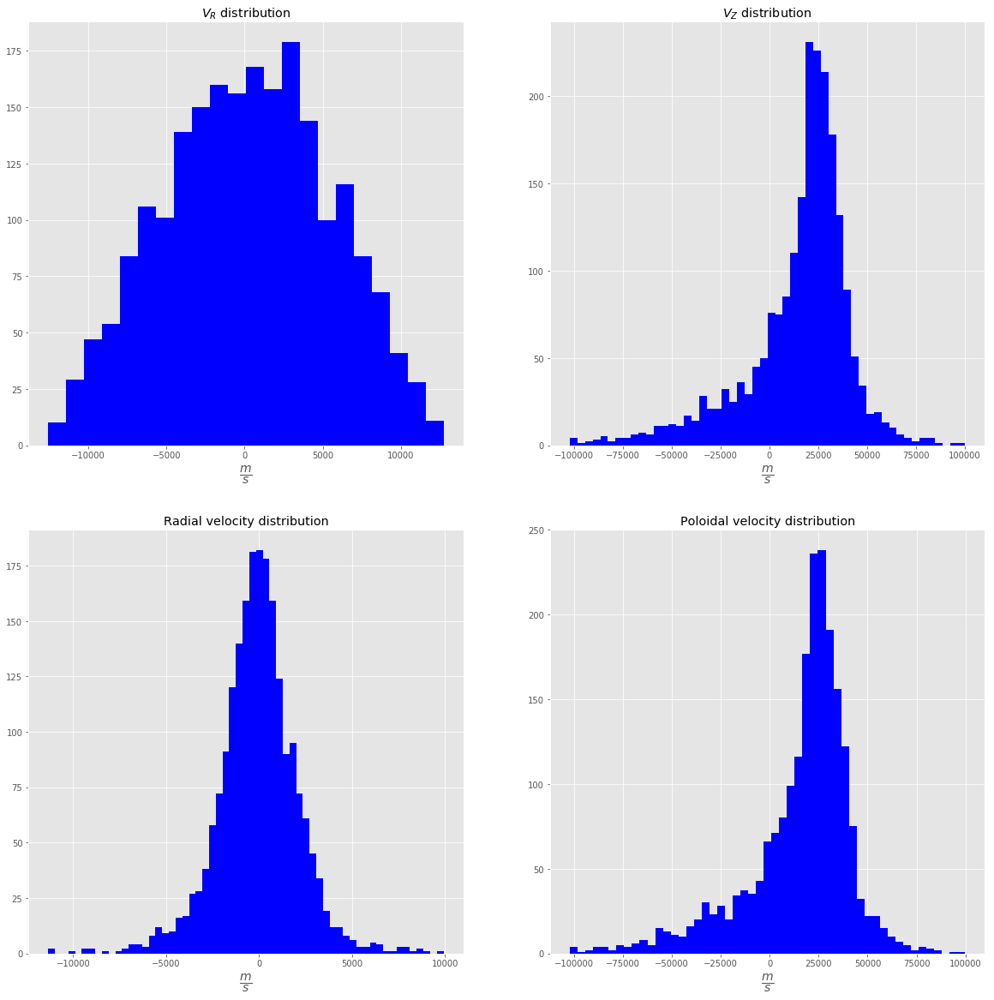

In [168]:
blobs.total_velocity_distributions(H2)

C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' 

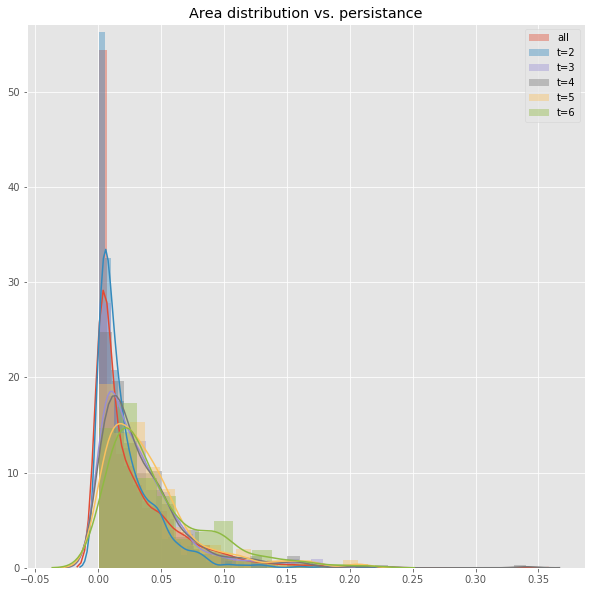

In [169]:
blobs.area_dist_persistance(H2)

C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' 

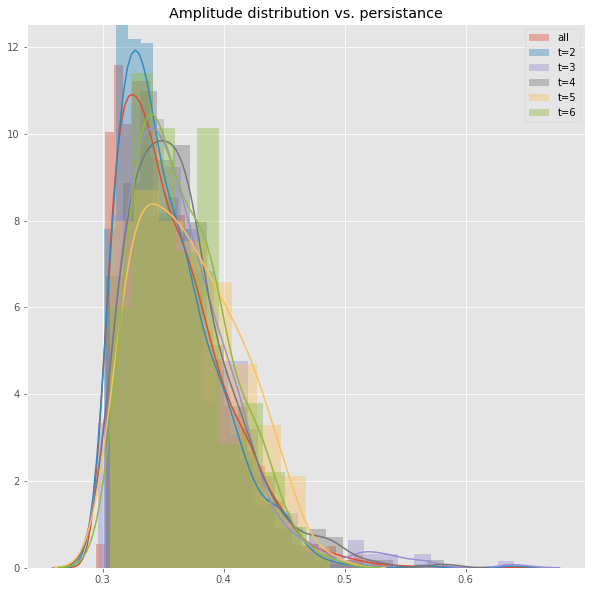

In [170]:
blobs.amplitude_dist_persistance(H2)

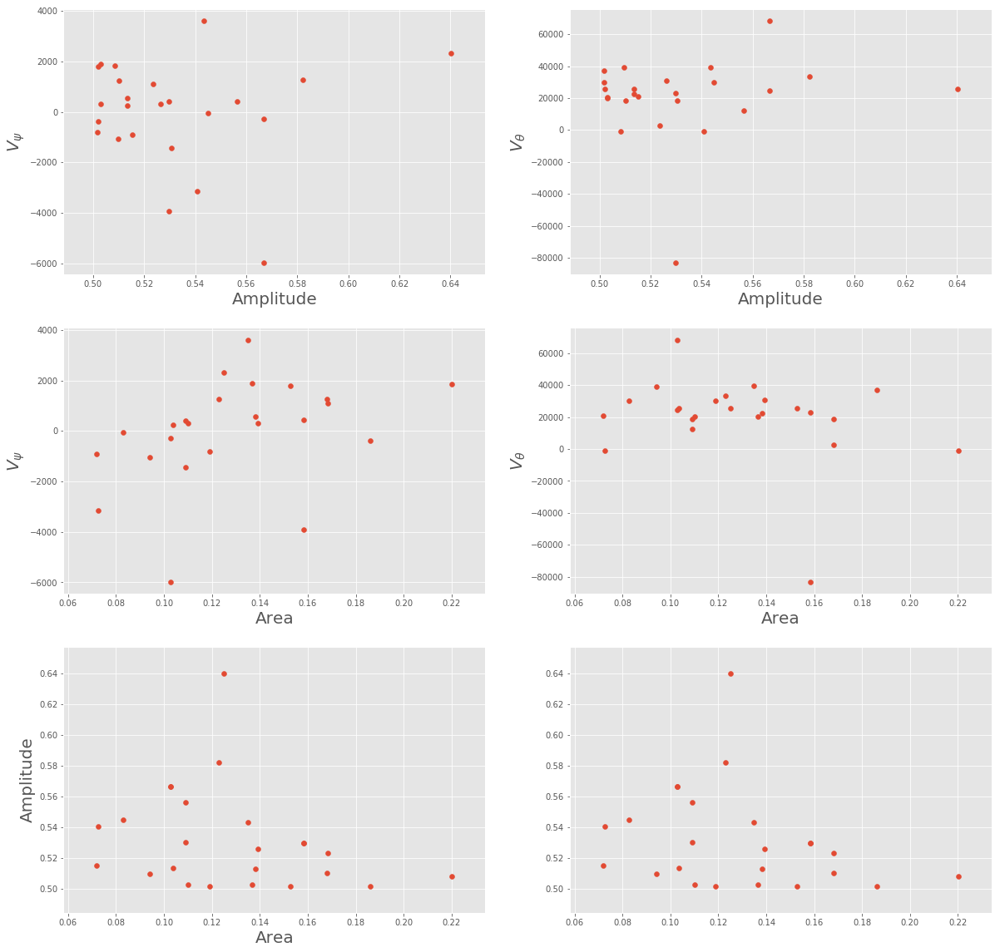

In [171]:
blobs.amplitude_velocity(H2)

C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' 

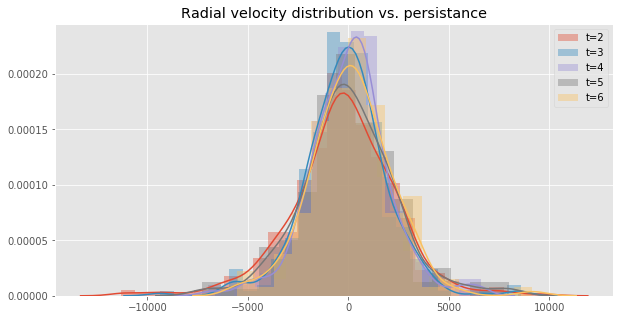

In [172]:
blobs.velocity_persistance_distributions(H2)

### Database distributions with 3 smoothings

In [41]:
reload(blobs)

<module 'blobs' from 'C:\\Users\\Giannis\\Desktop\\Python_scrpts\\blobs.py'>

In [174]:
#blobs.db_creation(arr_all,0,888,0.3,0.99)

C:\Users\Giannis\Desktop\Python_scrpts\blobs.py:557: RuntimeWarning: invalid value encountered in sqrt
  return np.real(np.array([res1, res2]))
C:\Users\Giannis\Desktop\Python_scrpts\blobs.py:556: RuntimeWarning: invalid value encountered in sqrt
  res2=np.sqrt(up/down2)


In [3]:
H3 = blobs.blob_history(0,877)

In [4]:
H3.shape

(325, 878)

C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


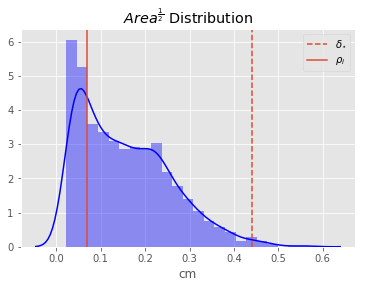

In [5]:
blobs.area_dist(0,887)

C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


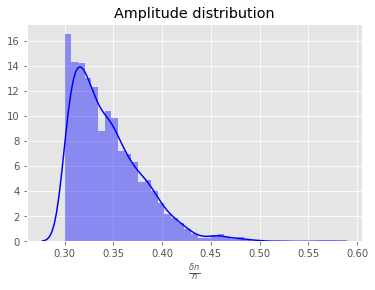

In [6]:
blobs.amplitude_dist(0,887)

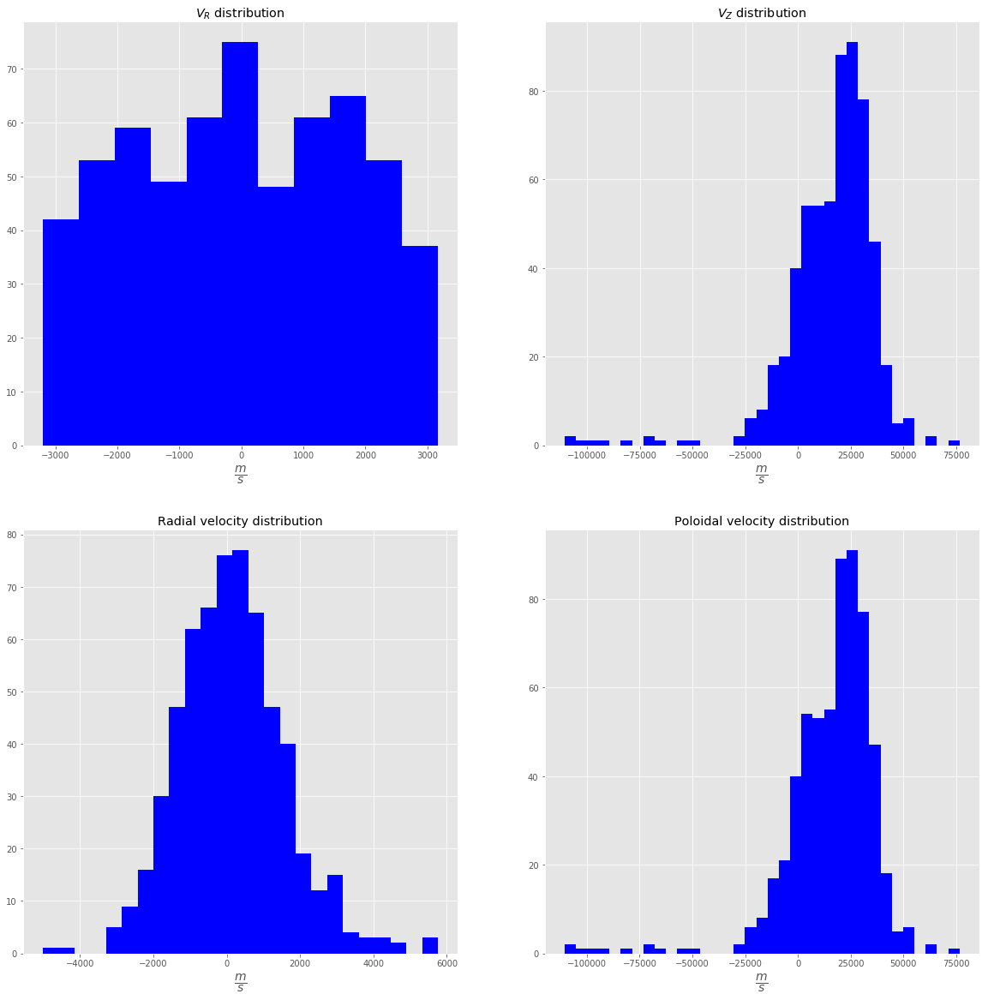

In [7]:
blobs.total_velocity_distributions(H3)

C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' 

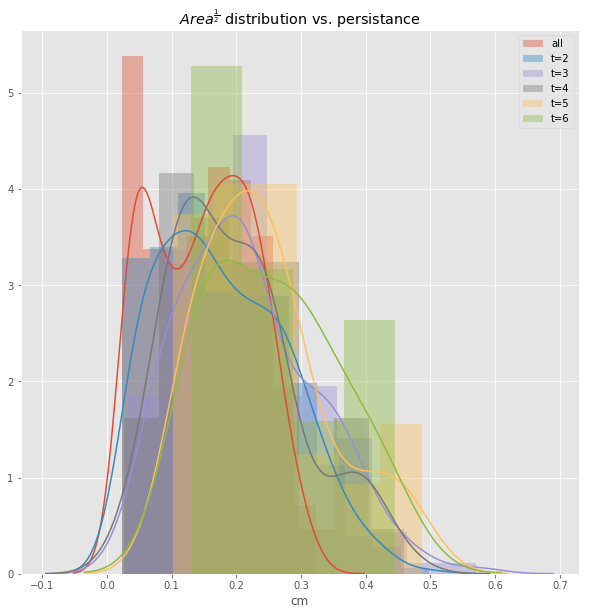

In [8]:
blobs.area_dist_persistance(H3)

C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\Giannis\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' 

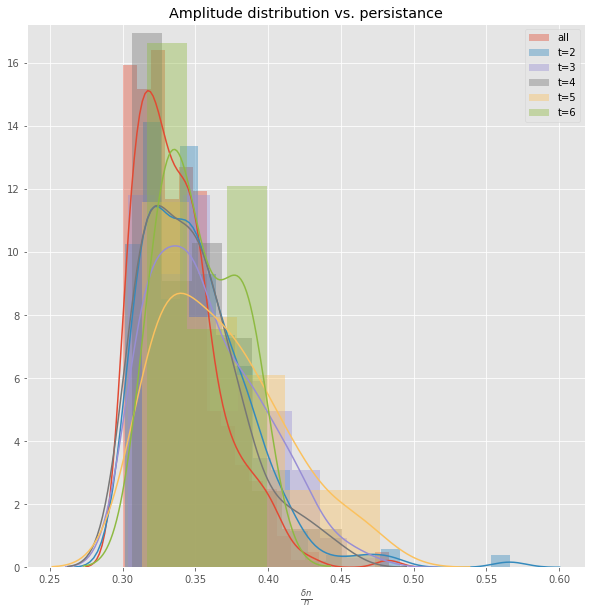

In [9]:
blobs.amplitude_dist_persistance(H3)
warnings.filterwarnings("ignore")

In [8]:
reload(blobs)

<module 'blobs' from 'C:\\Users\\Giannis\\Desktop\\Python_scrpts\\blobs.py'>

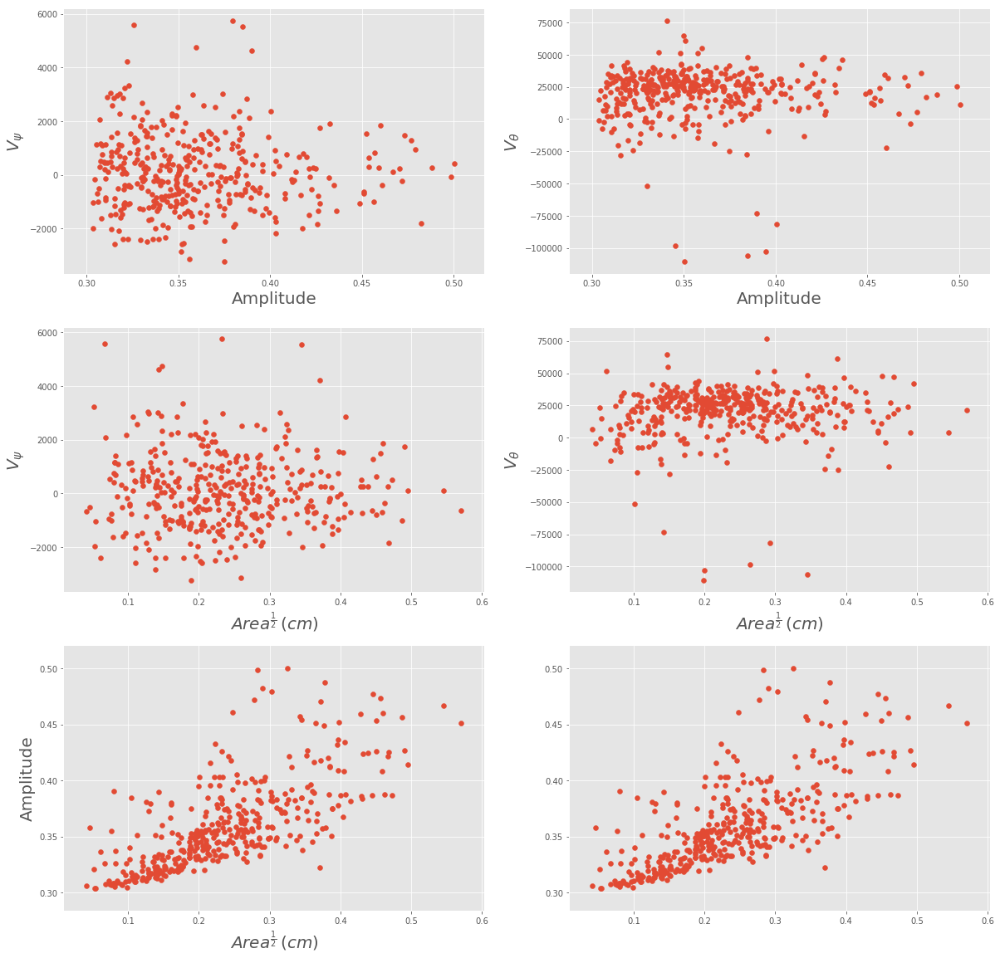

In [10]:
blobs.amplitude_velocity(H3)

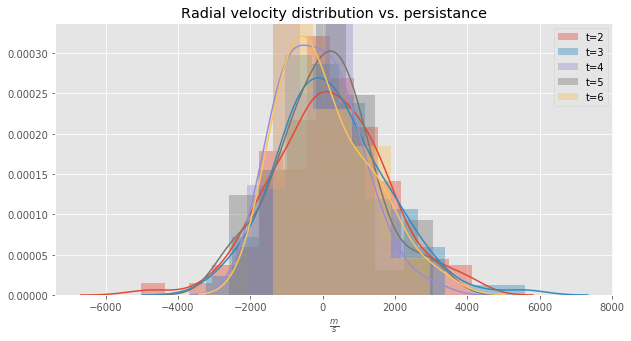

In [11]:
blobs.velocity_persistance_distributions(H3)

In [27]:
def delta_star():
    c_l = 5 #(m)
    R = 0.9 #(m)
    B = 4.05 #(Tesla)
    Te = 100 #(ev)
    mi_ref = 1.67236232e-27 #(kg)
    joule_conversion = 1.6022e-19
    m_i = 2*mi_ref
    e = 1.6022e-19
    om_cycl = (e*B)/m_i
    v_s = np.sqrt((2.*joule_conversion*Te)/m_i)
    rho_s = v_s/om_cycl
    d_star = rho_s*np.power((np.power(c_l,2)/(rho_s*R)),0.2)
    return d_star*100


In [28]:
delta_star()

0.4477596314223931